# Table of Contents
- [Customer Churn Analysis & Prediction](#customer-churn-analysis--prediction)
- [Metadata](#metadata)
- [Deep Dive](#deep-dive)
   - [Step 1: Required Libraries & Data Loading](#step-1-required-libraries--data-loading)
   - [Step 2: Data Cleaning & Preparation](#step-2-data-cleaning--preparation)
     - [Initial Data Exploration](#initial-data-exploration)
     - [Duplicate Data Detection](#duplicate-data-detection)
     - [Handling Missing Data](#handling-missing-data)
   - [Inserting Processed Data into Database](#inserting-processed-data-into-database)
     - [Creating the Database](#creating-the-database)
     - [Connecting to PostgresQL](#connecting-to-postgresql)
     - [Creating the Table](#creating-the-table)
     - [Inserting Data into the Table](#inserting-data-into-the-table)
   - [Step 3: Exploratory Data Analysis (EDA)](#step-3-exploratory-data-analysis-eda)
     - [Summary Statistics: Numerical Features](#summary-statistics-numerical-features)
     - [Summary Statistics: Categorical Features](#summary-statistics-categorical-features)
     - [Outlier Detection](#outlier-detection)
     - [Exploring Feature Distributions](#exploring-feature-distributions)
       - [Churn Trends & Insights: Categorical Features](#churn-trends--insights-categorical-features)
       - [Churn Trends & Insights: Numerical Features](#churn-trends--insights-numerical-features)
     - [Bivariate Analysis](#bivariate-analysis)
       - [Pearson Correlation - Numerical Variables](#pearson-correlation---numerical-variables)
       - [Non-Linear Correlation - Categorical Variables](#non-linear-correlation---categorical-variables)
- [Insights Extraction & Actionable Solutions](#insights-extraction--actionable-solutions)
- [Churn Rate Forecasting](#churn-rate-forecasting)
   - [Overview](#overview)
   - [Preprocessing](#preprocessing)
   - [Modeling](#modeling)
   - [Feature Importance](#feature-importance)
   - [Evaluation](#evaluation)
   - [Result Analysis](#result-analysis)

# Customer Churn Analysis & Prediction

Profit is the primary motivator for any business, and one effective way to maximize profits is by focusing on customer retention. Retaining existing customers should be a key priority for businesses, as a [Forbes study](https://www.forbes.com/councils/forbesbusinesscouncil/2022/12/12/customer-retention-versus-customer-acquisition/) shows that acquiring a new customer can cost 5 to 7 times more than retaining an existing one.

What is Customer Churn?
Customer churn refers to the phenomenon where customers or subscribers stop engaging with a company or service, also known as customer attrition. It is commonly referred to as the loss of clients or customers.

Customer churn analysis helps businesses understand why customers leave by identifying key patterns and risk factors. By analyzing factors like contract length, customer service interactions, and monthly charges, companies can pinpoint dissatisfaction drivers and take proactive measures to improve customer experience. This insight enables businesses to refine their pricing models, enhance customer support, and introduce loyalty programs to retain valuable customers.

Customer churn prediction takes this a step further by using machine learning models to forecast which customers are most likely to leave. By leveraging historical data, predictive models can identify at-risk customers in real time, allowing businesses to intervene with targeted retention strategies, such as personalized offers or improved service plans. This approach helps reduce revenue loss and improves long-term customer satisfaction.

In this analysis, we will be using the Databel Telecom Customer Churn Dataset, a publicly available dataset on [Kaggle](https://www.kaggle.com/datasets/yichienchong/databel-telecom-customer-churn-dataset), to explore key factors influencing churn and develop predictive models.




# Metadata

**Customer Status**

- *CustomerID* - unique customer identification number
- *Churn Label* - indicates if the customer churned
- *Churn Category* - classes of churns
- *Churn Reason* - the reason for the churn of the customer

**Demographic**

- *Under30* - indicates if the customer is under 30 years old
- *Senior* - indicates if the customer is a senior
- *Gender* - the gender of the customer
- *Age* - the age of the customer

**Contract Information**

- *Contract Type* - the subscription basis of the customer
- *Payment Method* - means of payment
- *Phone Number* - the phone number of the customer
- *Group* - indicates if the customer is part of a group plan
- *Number of Customers in a Group* - number of customers part of group

**Subscription Types & Charges**

- *Account Length (in months)* – the duration of the customer's tenure
- *Local Calls* - the number of local calls made
- *Local mins* - time spent on local calls made
- *Int Calls* - the number of international calls made
- *Intl mins* - time spent on local calls made
- *Intl Plan* – Indicates whether the customer has a premium plan for free international calls
- *Intl Active* – Indicates whether the customer makes international calls
- *Extra International Charges* - charges incurred on internatoinal calls for customers who are not on a premium plan
- *Customer Service Calls* - the number of calls made to customer service
- *Avg Monthly Download* - contains the average monthly download volume in gigabytes
- *Unlimited Data Plan* - if the customer subscribed for unlimited data
- *Monthly Charges* - charges incurred on each customer on a monthly basis
- *Total Charges* - total charges incurred on each customer

# Deep Dive

## Step 1: Required Libraries & Data Loading

In [74]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from IPython.display import display, HTML
import plotly.express as px

#import cufflinks as cf
#import plotly.graph_objects as go

import warnings
warnings.filterwarnings("ignore")

In [75]:
import os
import zipfile

# Getting the absolute path of the project directory
project_path = os.path.abspath(os.path.join(base_path, ".."))  # Go one level up
data_folder = os.path.join(project_path, "data")  # Store data inside 'data' in the main project

# Ensuring the correct 'data' folder exists
os.makedirs(data_folder, exist_ok=True)

# Updating paths for ZIP and CSV files
zip_file_path = os.path.join(data_folder, "databel-telecom-customer-churn-dataset.zip")
csv_file_path = os.path.join(data_folder, "Databel - Data.csv")

# Removing the "Downloads" folder if it exists
downloads_path = os.path.join(project_path, "Downloads")
if os.path.exists(downloads_path):
    import shutil
    shutil.rmtree(downloads_path)

# Ensuring the data folder exists
os.makedirs("../data", exist_ok=True)

# Checking if the dataset is already extracted
if not os.path.exists(csv_file_path):
    print("Dataset not found locally. Downloading and extracting...")

    # Downloading the dataset using Kaggle API
    !kaggle datasets download -d yichienchong/databel-telecom-customer-churn-dataset -p data/

    # Extracting the ZIP file
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(data_folder)

# Loading CSV into a DataFrame
df_initial = pd.read_csv(csv_file_path)

## Step 2: Data Cleaning & Preparation

- Verify the data types for consistency and address any discrepancies.
  
- Identify and handle duplicate records.

- Evaluate missing values and take appropriate action (remove or impute).

- Address missing data by either removing or imputing values, depending on the context.

- Outlier detection and treatment will be thoroughly explored during the Exploratory Data Analysis (EDA) phase (Step 3).

### Initial Data Exploration

In [3]:
df_initial.head(5)

,Customer ID,Churn Label,Account Length (in months),Local Calls,Local Mins,Intl Calls,Intl Mins,Intl Active,Intl Plan,Extra International Charges,...,Senior,Group,Number of Customers in Group,Device Protection & Online Backup,Contract Type,Payment Method,Monthly Charge,Total Charges,Churn Category,Churn Reason
0,4444-BZPU,No,1,3,8.0,0.0,0.0,No,no,0.0,...,No,No,0,No,Month-to-Month,Direct Debit,10,10,NaN,NaN
1,5676-PTZX,No,33,179,431.3,0.0,0.0,No,no,0.0,...,No,No,0,Yes,One Year,Paper Check,21,703,NaN,NaN
2,8532-ZEKQ,No,44,82,217.6,0.0,0.0,No,yes,0.0,...,No,No,0,Yes,One Year,Direct Debit,23,1014,NaN,NaN
3,1314-SMPJ,No,10,47,111.6,60.0,71.0,Yes,yes,0.0,...,No,No,0,No,Month-to-Month,Paper Check,17,177,NaN,NaN
4,2956-TXCJ,No,62,184,621.2,310.0,694.4,Yes,yes,0.0,...,No,No,0,No,One Year,Direct Debit,28,1720,NaN,NaN


In [4]:
df_initial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6687 entries, 0 to 6686
Data columns (total 29 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        6687 non-null   object 
 1   Churn Label                        6687 non-null   object 
 2   Account Length (in months)         6687 non-null   int64  
 3   Local Calls                        6687 non-null   int64  
 4   Local Mins                         6687 non-null   float64
 5   Intl Calls                         6687 non-null   float64
 6   Intl Mins                          6687 non-null   float64
 7   Intl Active                        6687 non-null   object 
 8   Intl Plan                          6687 non-null   object 
 9   Extra International Charges        6687 non-null   float64
 10  Customer Service Calls             6687 non-null   int64  
 11  Avg Monthly GB Download            6687 non-null   int64

In [5]:
df_initial.shape

(6687, 29)

In [6]:
df_initial.columns

Index(['Customer ID', 'Churn Label', 'Account Length (in months)',
       'Local Calls', 'Local Mins', 'Intl Calls', 'Intl Mins', 'Intl Active',
       'Intl Plan', 'Extra International Charges', 'Customer Service Calls',
       'Avg Monthly GB Download', 'Unlimited Data Plan', 'Extra Data Charges',
       'State', 'Phone Number', 'Gender', 'Age', 'Under 30', 'Senior', 'Group',
       'Number of Customers in Group', 'Device Protection & Online Backup',
       'Contract Type', 'Payment Method', 'Monthly Charge', 'Total Charges',
       'Churn Category', 'Churn Reason'],
      dtype='object')

In [7]:
df_initial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6687 entries, 0 to 6686
Data columns (total 29 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        6687 non-null   object 
 1   Churn Label                        6687 non-null   object 
 2   Account Length (in months)         6687 non-null   int64  
 3   Local Calls                        6687 non-null   int64  
 4   Local Mins                         6687 non-null   float64
 5   Intl Calls                         6687 non-null   float64
 6   Intl Mins                          6687 non-null   float64
 7   Intl Active                        6687 non-null   object 
 8   Intl Plan                          6687 non-null   object 
 9   Extra International Charges        6687 non-null   float64
 10  Customer Service Calls             6687 non-null   int64  
 11  Avg Monthly GB Download            6687 non-null   int64

### Duplicate Data Detection

In [8]:
df_initial.duplicated().sum()

0

We have no duplicate entries in this dataset.

### Handling Missing Data

In [9]:
df_initial.isnull().sum()

Customer ID                             0
Churn Label                             0
Account Length (in months)              0
Local Calls                             0
Local Mins                              0
Intl Calls                              0
Intl Mins                               0
Intl Active                             0
Intl Plan                               0
Extra International Charges             0
Customer Service Calls                  0
Avg Monthly GB Download                 0
Unlimited Data Plan                     0
Extra Data Charges                      0
State                                   0
Phone Number                            0
Gender                                  0
Age                                     0
Under 30                                0
Senior                                  0
Group                                   0
Number of Customers in Group            0
Device Protection & Online Backup       0
Contract Type                     

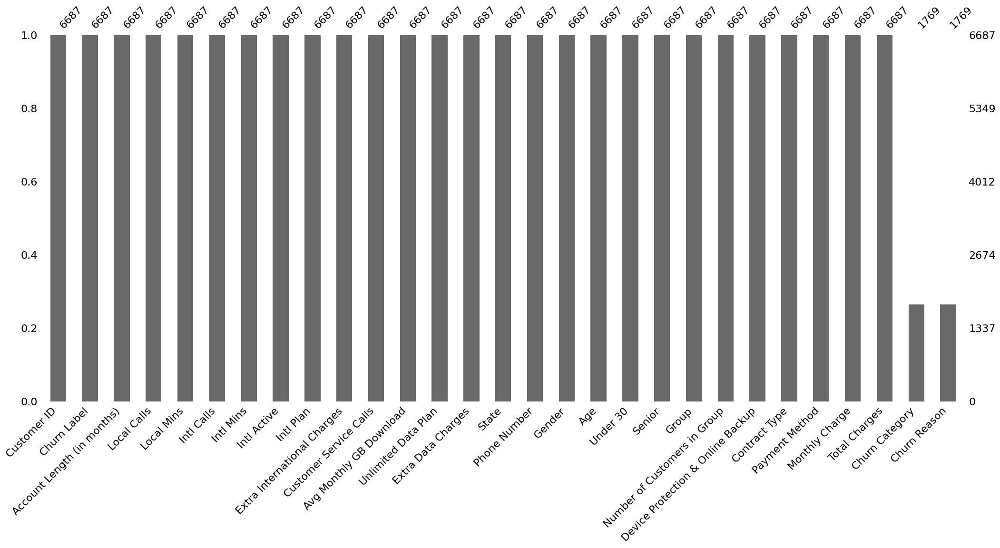

In [10]:
import missingno as msno

msno.bar(df_initial)
plt.show()

Churn Category and Churn Reason have a significant number of missing values (each has 4918 missing records). Since these columns are tied to churn, we can check if these entries are associated with customers who didn't churn. First, let's explore categories in these two columns.

In [11]:
df_initial["Churn Category"].unique()

array([nan, 'Competitor', 'Other', 'Attitude', 'Dissatisfaction', 'Price'],
      dtype=object)

In [12]:
df_initial["Churn Reason"].unique()

array([nan, 'Competitor made better offer', 'Moved',
       'Competitor had better devices',
       'Competitor offered higher download speeds',
       'Attitude of support person', 'Network reliability', "Don't know",
       'Service dissatisfaction', 'Product dissatisfaction',
       'Poor expertise of online support', 'Price too high',
       'Limited range of services',
       'Lack of affordable download/upload speed',
       'Long distance charges', 'Competitor offered more data',
       'Attitude of service provider', 'Poor expertise of phone support',
       'Extra data charges', 'Deceased',
       'Lack of self-service on Website'], dtype=object)

Let's check if these entries are associated with customers who didn't churn. 

In [13]:
# Count of missing values in 'Churn Category' and 'Churn Reason'
missing_churn_category = df_initial["Churn Category"].isna().sum()
missing_churn_reason = df_initial["Churn Reason"].isna().sum()

# Count of non-churned customers (Churn Label = "No")
non_churned_customers = len(df_initial[df_initial["Churn Label"] == "No"])

# Results
print(f"Missing records in churn category: {missing_churn_category}")
print(f"Missing records in churn reason: {missing_churn_reason}")
print(f"Non-churned customers: {non_churned_customers}")

Missing records in churn category: 4918
Missing records in churn reason: 4918
Non-churned customers: 4891


These numbers could imply that the null values in the "Churn Category" and "Churn Reason" columns are likely due to the customers not being in a churned state and therefore not having a relevant churn category/Reason.

To handle the null values properly,
we fill in the null values in the "Churn Category" column for non-churned customers ("No" churn label) with "Not Churned_C".
We also fill in the null values in the "Churn Reason" column for non-churned customers ("No" churn label) with "Not Churned_R".

In [14]:
df_initial.loc[df_initial["Churn Label"] == "No", "Churn Category"] = "Not Churned_C"
df_initial.loc[df_initial["Churn Label"] == "No", "Churn Reason"] = "Not Churned_R"

In [15]:
df_initial["Churn Category"].isnull().sum()

27

In [16]:
df_initial["Churn Reason"].isnull().sum()

27

**At this point, we have to options:**
- *Option1*-
For the churned customers (where "Churn Label" is "Yes"), we can fill the null values in "Churn Category" column with a specific category named "Unknown category".Also, for churners, we can fill the null values in "Churn Reason" column with a specific category named "Unknown Reason".e.g., df_initial["Churn Category"].fillna("Unknown Category", inplace=True)

- *Option2*-
Since there are only 27 missing records, we can simply drop the null values. 

Option 2 makes more sense here. 

In [17]:
# Dropping rows with NaN in 'Churn Category' and 'Churn Reason' and updating the DataFrame
df_initial = df_initial.dropna(subset=["Churn Category", "Churn Reason"])

In [18]:
# Final check for missing values
df_initial.isnull().sum()

Customer ID                          0
Churn Label                          0
Account Length (in months)           0
Local Calls                          0
Local Mins                           0
Intl Calls                           0
Intl Mins                            0
Intl Active                          0
Intl Plan                            0
Extra International Charges          0
Customer Service Calls               0
Avg Monthly GB Download              0
Unlimited Data Plan                  0
Extra Data Charges                   0
State                                0
Phone Number                         0
Gender                               0
Age                                  0
Under 30                             0
Senior                               0
Group                                0
Number of Customers in Group         0
Device Protection & Online Backup    0
Contract Type                        0
Payment Method                       0
Monthly Charge           

## Inserting Processed Data into Database

### Creating the Database

In [19]:
import psycopg2
import config  # Importing the configuration file for database credentials

# Step 1: Connecting to the default PostgreSQL database to create the new database
conn = psycopg2.connect(
    dbname="postgres",  # Default database to connect to
    user=config.DB_USER,
    password=config.DB_PASSWORD,
    host=config.DB_HOST,
    port=config.DB_PORT
)
conn.autocommit = True  # Enabling autocommit so changes are applied automatically
cursor = conn.cursor()

# Step 2: Creating the 'customer_churn_database' if it does not exist
cursor.execute("SELECT 1 FROM pg_catalog.pg_database WHERE datname = %s", ('customer_churn_database',))
exists = cursor.fetchone()
if not exists:
    cursor.execute('CREATE DATABASE customer_churn_database;')
    print("Database 'customer_churn_database' created successfully.")
else:
    print("Database 'customer_churn_database' already exists.")

conn.close()  # Closing the initial connection to 'postgres'

Database 'customer_churn_database' already exists.


### Connecting to PostgreSQL

In [20]:
# Step 1: Connecting to the 'customer_churn_database' using credentials from config.py
conn = psycopg2.connect(
    dbname=config.DB_NAME,
    user=config.DB_USER,
    password=config.DB_PASSWORD,
    host=config.DB_HOST,
    port=config.DB_PORT
)
conn.autocommit = True  # Enabling autocommit so changes are applied automatically
cursor = conn.cursor()

### Creating the Table

In [21]:
# Step 2: Creating the table if it does not exist
create_table_query = """CREATE TABLE IF NOT EXISTS customer_churn_table (
    "Customer ID" VARCHAR(255),
    "Churn Label" VARCHAR(255),
    "Account Length (in months)" INTEGER,
    "Local Calls" INTEGER,
    "Local Mins" FLOAT,
    "Intl Calls" FLOAT,
    "Intl Mins" FLOAT,
    "Intl Active" VARCHAR(255),
    "Intl Plan" VARCHAR(255),
    "Extra International Charges" FLOAT,
    "Customer Service Calls" INTEGER,
    "Avg Monthly GB Download" INTEGER,
    "Unlimited Data Plan" VARCHAR(255),
    "Extra Data Charges" INTEGER,
    "State" VARCHAR(255),
    "Phone Number" VARCHAR(255),
    "Gender" VARCHAR(255),
    "Age" INTEGER,
    "Under 30" VARCHAR(255),
    "Senior" VARCHAR(255),
    "Group" VARCHAR(255),
    "Number of Customers in Group" INTEGER,
    "Device Protection & Online Backup" VARCHAR(255),
    "Contract Type" VARCHAR(255),
    "Payment Method" VARCHAR(255),
    "Monthly Charge" INTEGER,
    "Total Charges" INTEGER,
    "Churn Category" VARCHAR(255),
    "Churn Reason" VARCHAR(255),
    "Churned" INTEGER
);"""

# Dropping the existing data in the table 
# cursor.execute("DROP TABLE IF EXISTS customer_churn_table;") # Executing Table Creation
cursor.execute(create_table_query)
conn.commit()

# Dropping the existing data in the table
cursor.execute("DELETE FROM customer_churn_table;")
conn.commit()

### Inserting Data into the Table

In [22]:
# Step 4: Inserting the processed DataFrame into the table
for _, row in df_initial.iterrows():
    values = tuple(row)  # Converting row to a tuple
    placeholders = ", ".join(["%s"] * len(row))
    insert_query = f"INSERT INTO customer_churn_table VALUES ({placeholders})"
    cursor.execute(insert_query, values)

conn.commit()  # Committing changes to the database
print("Processed data has been written to the database.")

Processed data has been written to the database.


The dataset is ready for analysis.

## Step 3: Exploratory Data Analysis (EDA)

- Convert categorical variables to numerical representations as needed (using pd.get_dummies or LabelEncoder).
  
- Convert numerical variables into categorical brackets when appropriate (using pd.cut() or pd.qcut()).

- Analyze the churn distribution to understand the proportion of churned customers.

- Examine correlations between variables to identify factors influencing churn.

- Compare characteristics of churned vs. non-churned customers, such as average Monthly Charge and Total Charges.

- Perform segmentation analysis to assess churn across different categories, such as Contract Type, Payment Method, and International Plan.

### Summary Statistics: Numerical Features

In [23]:
df_initial.describe().T

,count,mean,std,min,25%,50%,75%,max
Account Length (in months),6660.0,32.345495,24.612058,1.0,9.000,29.0,55.00,77.0
Local Calls,6660.0,130.981532,121.953827,1.0,31.000,98.0,199.00,918.0
Local Mins,6660.0,322.822102,288.791906,4.0,76.775,250.5,498.20,1234.2
Intl Calls,6660.0,51.063085,103.666036,0.0,0.000,0.0,50.00,1120.0
Intl Mins,6660.0,130.065925,243.740901,0.0,0.000,0.0,140.00,1372.5
Extra International Charges,6660.0,33.674399,76.444649,0.0,0.000,0.0,16.30,585.8
Customer Service Calls,6660.0,0.917417,1.413076,0.0,0.000,0.0,2.00,5.0
Avg Monthly GB Download,6660.0,6.692793,7.458223,0.0,1.000,5.0,9.00,43.0
Extra Data Charges,6660.0,3.384234,12.585934,0.0,0.000,0.0,0.00,99.0
Age,6660.0,47.453153,16.962811,19.0,33.000,47.0,60.00,85.0


<span style="font-size: 20px;">**Key Insights Regarding Numerical Features:**

This summary statistics a snapshot of various customer attributes related to a service plan. First, it reveals important information about usage patterns and spending. For example, the average account length is around 32 months, with a standard deviation of 24 months, suggesting significant variation in customer tenure. Local calls have a high average count of 130 with a large standard deviation, indicating that many customers make relatively few calls, while others make significantly more. International calls and minutes, however, are much less frequent, with a substantial portion of customers not using these services at all, as indicated by the minimum value of 0 for both calls and minutes. This suggests that international services may not be as popular among the customer base.

In terms of spending, the table shows that the average monthly charge is 31.03 dollars, with a wide range from 5 dollars to 78 dollars. This could indicate a mix of different service plans, some of which are quite inexpensive, while others offer more premium features. Additionally, "Extra International Charges" and "Extra Data Charges" have relatively low means, with many customers not incurring these charges, suggesting that most customers stick to their base service plans without opting for additional international or data features. On the other hand, "Total Charges" can go as high as 5574 dollars, reflecting cumulative spending over the account's lifetime, with an average of about 1083.82 dollars.

Other features such as the "Customer Service Calls" column show that most customers make few calls to customer service, with the average being less than 1 call. This could indicate a relatively smooth service experience for most customers. "Avg Monthly GB Download" also shows moderate usage (6.69 GB), with a few outliers reaching much higher values, potentially identifying a group of power users. The "Age" column, with an average age of 47.45, further suggests that the customer base is middle-aged, with most customers falling between 33 and 60 years old. Finally, the "Number of Customers in Group" is low on average, indicating that the majority of customers are on individual plans rather than group plans. Overall, this data provides a detailed view of customer behavior, usage, and spending patterns, which can be useful for segmentation and identifying trends or anomalies.

### Summary Statistics: Categorical Features

In [24]:
df_initial.describe(include='object').T

,count,unique,top,freq
Customer ID,6660,6660,4444-BZPU,1
Churn Label,6660,2,No,4891
Intl Active,6660,2,No,4102
Intl Plan,6660,2,no,6014
Unlimited Data Plan,6660,2,Yes,4471
State,6660,51,WV,213
Phone Number,6660,6650,311-9063,2
Gender,6660,3,Male,3365
Under 30,6660,2,No,5378
Senior,6660,2,No,5438


<span style="font-size: 20px;">**Key Insights Regarding Categorical Features:**

This dataset provides a wide range of demographic and subscription-related information about the customers, offering valuable insights into customer behavior and preferences. The "Gender" column indicates that the customer base is predominantly male, with 3365 male customers compared to 2285 females. The "State" column shows that there are customers across all 51 states in the U.S., with West Virginia (WV) having the highest frequency of customers, suggesting it may have a larger customer concentration in the dataset. The "Under 30" and "Senior" columns suggest that the majority of customers are neither under 30 nor seniors, with most customers falling in the middle age range, reflecting a more general demographic distribution.

Regarding service usage, it appears that a large portion of the customers have opted out of international services, as indicated by the "Intl Active" and "Intl Plan" columns, where most customers do not have international plans. The "Unlimited Data Plan" column shows that most customers have chosen the unlimited data plan, indicating a preference for flexible and extensive data usage. Additionally, the "Contract Type" column reveals that the majority of customers are on month-to-month plans, which could reflect a more transient or flexible customer base. The "Payment Method" data shows that most customers prefer direct debit, which is often convenient for automated payments, although other methods like credit card or online payments are also available.

The "Device Protection & Online Backup" column reveals that a majority of customers opt out of additional protection and backup services, with fewer choosing to pay for these extras. This suggests that customers may be more budget-conscious or believe that the base service offers sufficient coverage. Finally, the "Churn Category" and "Churn Reason" columns categorize customers based on their churn status and the reason for churn, although it is important to note that these may be less relevant without churn-specific analysis. Overall, the dataset paints a picture of a diverse customer base with specific preferences for service plans, payment methods, and additional services. These insights could help inform decisions related to customer segmentation, marketing strategies, and service offerings.

In [25]:
df_initial["Churn Label"].unique()

array(['No', 'Yes'], dtype=object)

Creating new columns and making changes to the initial_df:

In [26]:
# Creating Churned column with 1 & 0 values
df = df_initial
df["Churned"]=np.where(df_initial["Churn Label"]=='Yes', 1, 0)

In [27]:
df['Churned'].value_counts()

Churned
0    4891
1    1769
Name: count, dtype: int64

In [28]:
round(df_initial["Churned"].mean(), 2)*100

27.0

In [29]:
# Saving the processed data to a csv file 
# df.to_csv('df_churn_preprocessed.csv', index=False)

### Outlier Detection

Visual display:

Number of Categorical columns: 16
Number of Numerical columns: 14



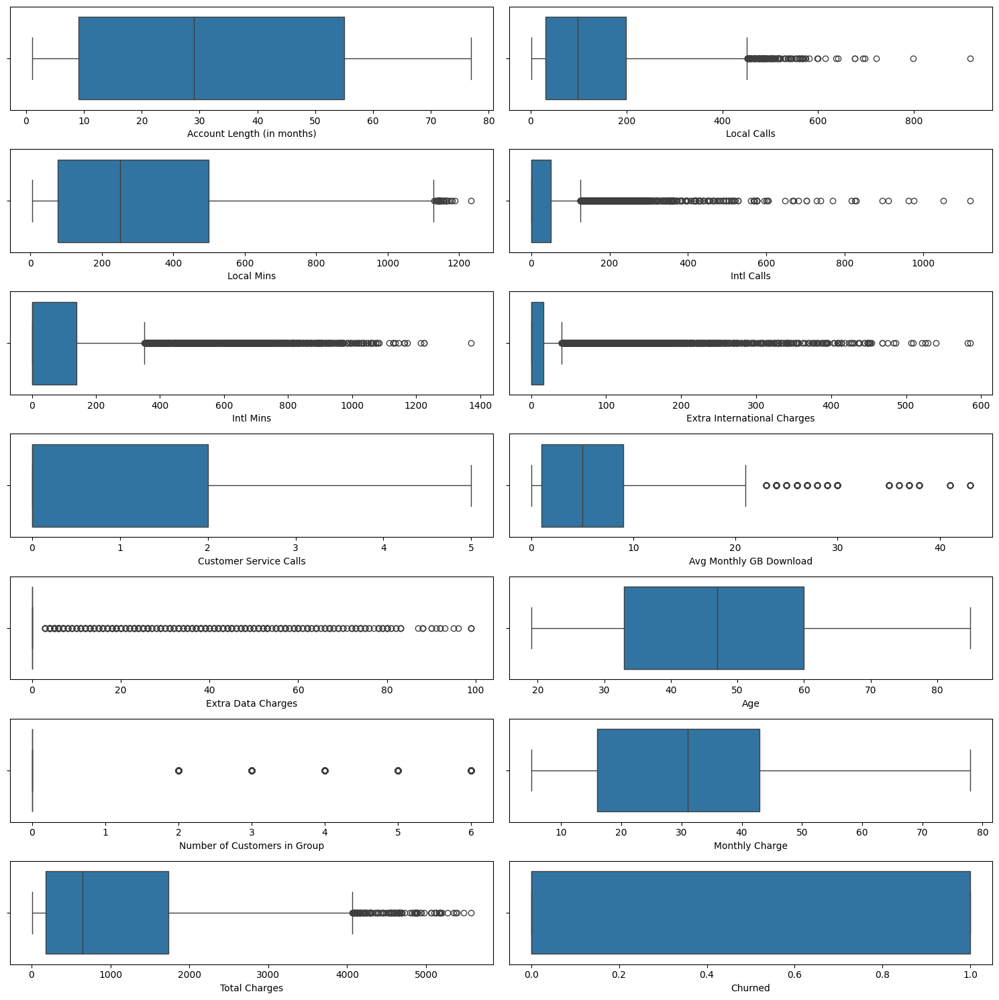

In [30]:
# Creating two empty lists to store numerical and categorical variables.
cat_vars = []
num_vars = []

for column_name in df.columns:
    if df[column_name].dtype == 'object':        
        cat_vars.append(column_name)
    else:
        num_vars.append(column_name)

print(f"Number of Categorical columns: {len(cat_vars)}")
print(f"Number of Numerical columns: {len(num_vars)}\n")

# Setting the figure size
fig, axs = plt.subplots(nrows=7, ncols=2, figsize=(15, 15))
axs = axs.flatten()

# creating box plot for numerical columns
for i, var in enumerate(num_vars):
    sns.boxplot(x=var, data=df, ax=axs[i])
    
    # labeling axis explicitly
    axs[i].set_xlabel(var)
    #axs[i].set_ylabel('Values')

fig.tight_layout() 
plt.show()

**Explanation:**

Box plots highlight the outliers for the following columns:

'Local Calls', 'Local Mins', 'Intl Calls', 'Intl Mins', 'Extra International Charges', 'Avg Monthly GB Download', 'Extra Data Charges', and 'Total Charges'.

So far, we have visually identified the columns with outliers. Next, we will examine the distribution of these columns. 
If they follow a normal distribution, we can safely use the z-score to detect specific outliers. 

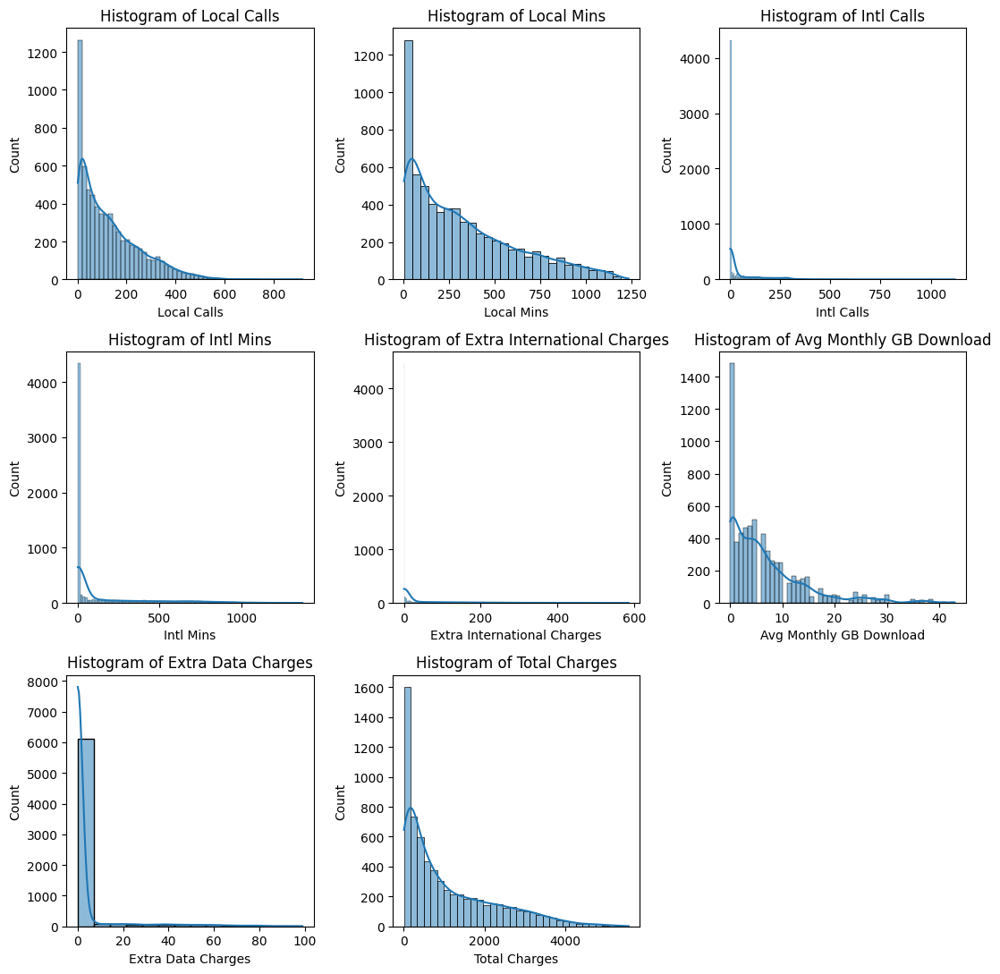

In [31]:
# The columns with potential outliers 
columns_to_plot = ['Local Calls', 'Local Mins', 'Intl Calls', 'Intl Mins', 'Extra International Charges', 'Avg Monthly GB Download',\
                      'Extra Data Charges', 'Total Charges']

# Setting the number of rows and columns
n_rows = 3
n_cols = 3

# Calculating the number of subplots needed
n_plots = len(columns_to_plot)

# Creating the subplots
fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(11, 11))  
axs = axs.flatten()  

# Creating histograms for each column
for i, col in enumerate(columns_to_plot):
    sns.histplot(df[col], kde=True, ax=axs[i])  
    axs[i].set_title(f'Histogram of {col}')  

# Hiding the last empty subplot if there are only 7 columns
for i in range(n_plots, len(axs)):
    axs[i].axis("off")

plt.tight_layout()  
plt.show()


Since the data is not normally distributed, the standard Z-score method does not work well for the outlier detection. 
Instead, we have at least 2 common options here:

**Option 1: 95% Confidence Interval (Percentile-Based):**
Calculate the 2.5th percentile (lower bound) and 97.5th percentile (upper bound), any value outside this range is considered an outlier.

**Option 2: Modified Z-Score (More Robust than Standard Z-Score):**
We can use the Modified Z-Score method based on the Median Absolute Deviation (MAD) for non-normally distributed data.
Here, outliers are points where |M| > 3.5.

We choose option 1 to detect extreme outliers with a high confidence interval(99%). 

In [32]:
# Defining the lower and upper bounds for each column 
lower_bound = df[columns_to_plot].quantile(0.005)  # 0.5th percentile
upper_bound = df[columns_to_plot].quantile(0.995)  # 99.5th percentile

# Creating a dictionary to store outlier values for each column
outliers_dict = {}

for column in columns_to_plot:
    # Filtering the outliers for each column
    outliers = df[(df[column] < lower_bound[column]) | (df[column] > upper_bound[column])]
    
    # Adding the outliers as a list to the dictionary
    outliers_dict[column] = outliers[column].tolist()

# Printing the outlier lists for each column
for column, outliers_list in outliers_dict.items():
    print(f"{column} outliers: {outliers_list[:5]}... \n")  # Displaying the first 10 outliers 
    #print(f"{column} outliers:\n {outliers_list}\n")    # Displaying the full list


Local Calls outliers: [542, 541, 555, 1, 567]... 

Local Mins outliers: [1171.3, 1158.8, 1144.1, 1234.2, 1162.9]... 

Intl Calls outliers: [1050.0, 962.0, 828.0, 568.0, 576.0]... 

Intl Mins outliers: [1029.3, 1225.0, 1085.0, 1065.0, 1057.9]... 

Extra International Charges outliers: [436.6, 506.3, 423.5, 445.4, 418.5]... 

Avg Monthly GB Download outliers: [41, 43, 41, 41, 43]... 

Extra Data Charges outliers: [80, 83, 95, 80, 88]... 

Total Charges outliers: [5129, 4856, 7, 4883, 4893]... 



<span style="font-size: 20px;"> Final Result & Insights After Analyzing Outliers:

**Contextual Analysis:**

For most of these columns, outliers likely represent extreme but plausible cases (e.g., high international usage, large data usage). However, some outliers might be indicative of errors (like the repeated 7 in the Total Charges column).

We should consider the context in which this data was collected. Are these extreme values expected (e.g., high international calls or data usage in certain cases)? Are there known data entry issues (e.g., erroneous 7 values)?

**Impact on Statistical Analysis:**

*Skewed Distribution:* Many of the columns (like Local Mins, Intl Calls, and Total Charges) show a skewed distribution due to the presence of outliers. This could affect models that assume normality. (e.g., linear regression, ANOVA, t-tests, and Gaussian Naive Bayes )

*Variance and Model Sensitivity*: Outliers with extreme values (e.g., Total Charges) are likely increasing the variance in the data. This may affect regression models due to their sensitivity to outliers.

**Possible Outlier Treatment:**

- **Removing Outliers:** 
If the goal is to make the data more homogenous and fit certain statistical models, removing extreme outliers might improve the model’s performance. We can remove data points beyond a defined percentile threshold (such as 99.5%).

- **Winsorization:** 
Instead of removing extreme outliers, we can "winsorize" them by replacing extreme values with a defined threshold (e.g., the 99th percentile). This approach preserves the data and reduces the impact of outliers.

- **Transforming the Data:** 
Log transformations or other scaling methods can reduce the impact of extreme outliers by compressing the range of values.

- **Keep Outliers:** 
If the outliers represent valid behavior (e.g., extremely high international calls), it might be better to leave them in the dataset. 

**Further Investigation:**


For columns like Total Charges, where 7 appears repeatedly, we need to investigate if these values represent missing or erroneous data that needs to be cleaned or replaced.

Correlation with Other Variables: it should be checked if these outliers correlate with other variables in the dataset. For example, do high Intl Calls correlate with high Total Charges or Extra International Charges?

**Final Decision on Outlier Treatment:** 

Given that these extreme values may provide valuable insights for our analysis and the recommendations derived from them, and considering that this analysis is conducted on an open-source dataset with no access to additional information about how the data is collected, I have decided to retain all of them.

### Exploring Feature Distributions

<span style="font-size: 20px;"> The distribution analysis helps answer questions like the following:

- *Question*: How frequently do customers contact customer service, and what is the distribution of customer service calls in the dataset?
- *Question*: Is there a correlation between customer tenure (account length) and churn, and do newer customers have a higher churn rate than long-term customers?
- *Question*: How does churn vary across different customer segments, such as age, contract type, or payment method?
- *Question*: What is the distribution of the number of customers in each state?
- *QuestAion*: What is the distribution of local call usage among churned and non-churned customers?
- *Question*: What role do customer service interactions play in reducing churn, and do churned customers have fewer interactions with customer service?
- *Question*: How does pricing (monthly charges) influence churn behavior, and are churned customers more likely to find the service too expensive?
- *Question*: Are there specific states where churn rates are higher?
- *Question*: How does the usage of international services (calls, minutes, extra charges) affect churn, and do churned customers differ in their usage compared to non-churned customers?
- *Question*: What percentage of customers have premium international plans, and how does that compare between churned and non-churned customers?
- *Question*: Is there a correlation between customer tenure (account length) and churn, and do newer customers have a higher churn rate than long-term customers?

#### Churn Trends & Insights: Categorical Features

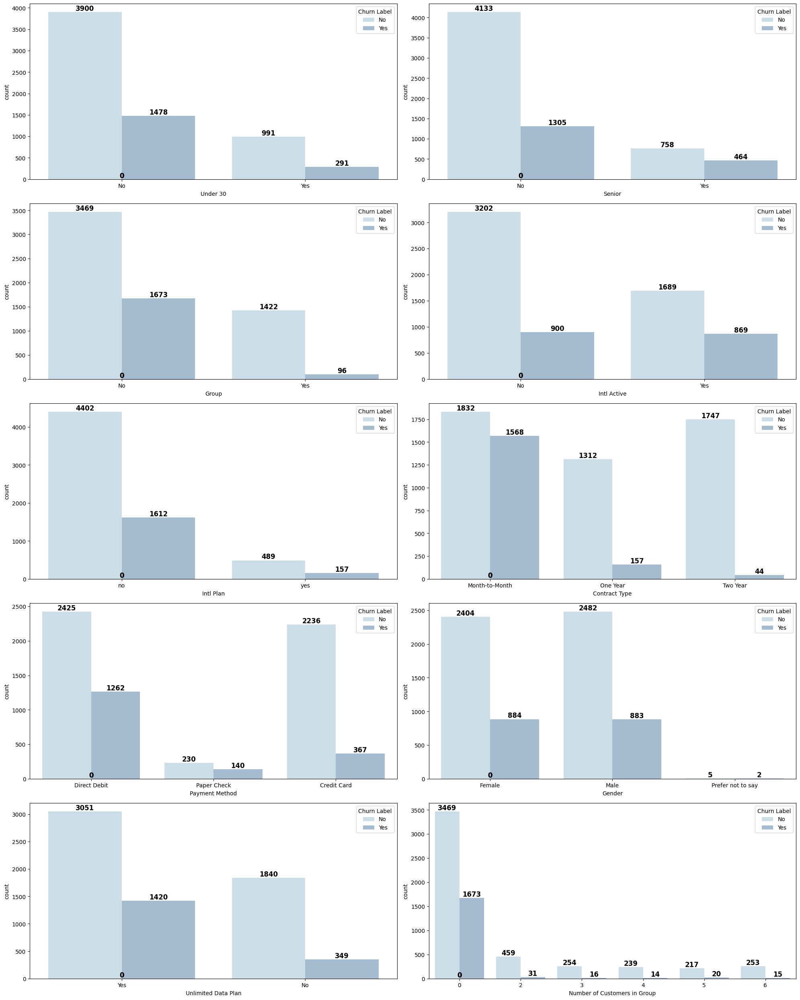

In [33]:
# Defining the color palette
palette = sns.color_palette("ch:s=.25,rot=-.25")

# List of columns to plot
columns = ["Under 30", "Senior", "Group", "Intl Active", "Intl Plan",
           "Contract Type", "Payment Method", "Gender", "Unlimited Data Plan", "Number of Customers in Group"]

# Defining number of rows and columns
n_cols = 2  # Two columns
n_rows = -(-len(columns) // n_cols)  # Ceiling division

# Creating subplots
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 5 * n_rows))  # Adjust height dynamically

# Flattening the axes array for easy iteration
axes = axes.flatten()

# Creating count plots with annotations
for i, col in enumerate(columns):
    ax = axes[i]
    sns.countplot(x=col, data=df, hue="Churn Label", ax=ax, palette=palette)
    
    # Annotating bars with counts
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='bottom', fontsize=12, fontweight='bold', color='black')

# Removing any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


Each count plot shows the distribution of customers across different categories for each feature, segmented by churn status. These insights help identify which customer segments are more likely to churn.

In [34]:
# List of columns to analyze
columns = ["Under 30", "Senior", "Group", "Intl Active", "Intl Plan",
           "Contract Type", "Payment Method", "Gender", "Unlimited Data Plan", "Number of Customers in Group"]

# Computing counts for each category grouped by "Churn Label"
results = {}

for col in columns:
    count_df = df.groupby([col, "Churn Label"]).size().unstack(fill_value=0)
    results[col] = count_df  # Store in dictionary

# Display the results
for col, table in results.items():
    print(f"\nCategory: {col}\n")
    print(table)


Category: Under 30

Churn Label    No   Yes
Under 30               
No           3900  1478
Yes           991   291

Category: Senior

Churn Label    No   Yes
Senior                 
No           4133  1305
Yes           758   464

Category: Group

Churn Label    No   Yes
Group                  
No           3469  1673
Yes          1422    96

Category: Intl Active

Churn Label    No  Yes
Intl Active           
No           3202  900
Yes          1689  869

Category: Intl Plan

Churn Label    No   Yes
Intl Plan              
no           4402  1612
yes           489   157

Category: Contract Type

Churn Label       No   Yes
Contract Type             
Month-to-Month  1832  1568
One Year        1312   157
Two Year        1747    44

Category: Payment Method

Churn Label       No   Yes
Payment Method            
Credit Card     2236   367
Direct Debit    2425  1262
Paper Check      230   140

Category: Gender

Churn Label          No  Yes
Gender                      
Female             2

The analysis of categorical variables reveals several insights into customer churn patterns. Younger customers ("Under 30") show a higher churn rate, with 22.7% of them leaving compared to 27.5% for older customers. Interestingly, senior customers exhibit a significantly higher churn proportion (37.9%), suggesting that older users might face issues with service relevance, pricing, or digital literacy. Customers in groups churn much less than those without a group membership (only 6.3% churn vs. 32.5% for solo users), implying that group discounts or shared plans enhance retention.

Regarding international features, having an international plan does not seem to significantly reduce churn, as both groups have similar churn rates (~26%). However, customers classified as "Intl Active" churn at a higher rate (34%) than non-active ones (21.9%), indicating dissatisfaction with international rates. The contract type plays a critical role, with 46% of month-to-month customers churning, compared to only 10.7% for one-year and a remarkably low 2.5% for two-year contracts. Payment method also matters, as direct debit users experience high churn (34.2%) compared to credit card users (14.1%), likely due to financial constraints or billing-related dissatisfaction.

Finally, customers on an unlimited data plan churn significantly more (31.8%) than those without (15.9%), which could suggest dissatisfaction despite unlimited access—possibly due to pricing, speed throttling, or competition. Additionally, larger groups (2+ members) exhibit very low churn (around 5%), reinforcing the idea that bundled services improve retention. These insights highlight key areas for targeted retention strategies, such as offering more attractive long-term contracts, improving group-based incentives, and addressing international usage concerns.

In [35]:
# Calculating churn rate by state
churn_rate_by_state = df.groupby('State')['Churned'].mean().reset_index()

# Plotting a choropleth map using Plotly
fig = px.choropleth(churn_rate_by_state, 
                    locations='State', 
                    locationmode="USA-states", 
                    color='Churned', 
                    hover_name='State',
                    color_continuous_scale="Viridis",
                    title="Churn Rate by State")

fig.show()

We observe that California has the highest number of churned customers among all 51 states. 

In [36]:
# Calculating churn count by state
churn_by_state = df.groupby(['State', 'Churned']).size().reset_index(name='Count')

# Plotting a bar plot using Plotly
fig = px.bar(churn_by_state, x='State', y='Count', color='Churned', 
             title="Churn Distribution by State", 
             labels={'Churned': 'Churned (1=Yes, 0=No)', 'State': 'State'},
             category_orders={'Churned': [0, 1]})

# Customizing layout for better visibility
fig.update_layout(xaxis_tickangle=-90, xaxis={'categoryorder':'total descending'}, 
                  barmode='stack', height=600)

fig.show()

Although the map shows that California has the highest number of churned customers, the distribution plot reveals a low number of customers in this state. Therefore, this may not be a priority when developing a churn reduction strategy.

#### Churn Trends & Insights: Numerical Features

**Total Churn Rate**

In [37]:
churn_rate = df['Churned'].sum() / len(df) * 100  # Percentage of churned customers
churn_rate

26.561561561561565

**Kernel Density Estimation Analysis**

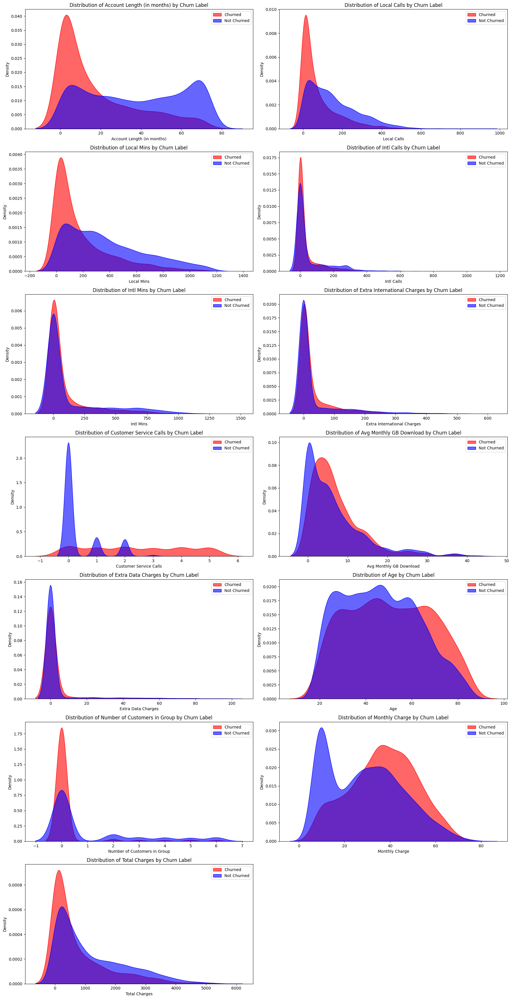

In [38]:
# Defining the color palette
palette = sns.color_palette("ch:s=.25,rot=-.25")

# List of numerical columns
num_columns = ['Account Length (in months)', 'Local Calls', 'Local Mins', 'Intl Calls',
               'Intl Mins', 'Extra International Charges', 'Customer Service Calls',
               'Avg Monthly GB Download', 'Extra Data Charges', 'Age',
               'Number of Customers in Group', 'Monthly Charge', 'Total Charges']

# Setting up the number of rows and columns
n_cols = 2
n_rows = -(-len(num_columns) // n_cols)  # Ceiling division to determine rows

# Creating the subplots
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(18, 5 * n_rows))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Generating KDE plots for each column
for i, col in enumerate(num_columns):
    ax = axes[i]
    
    # Ensure column has valid data
    if df[col].nunique() > 1:  # KDE needs more than one unique value
        sns.kdeplot(df[df['Churn Label'] == 'Yes'][col], fill=True, label="Churned", ax=ax, color='red', alpha=0.6)
        sns.kdeplot(df[df['Churn Label'] == 'No'][col], fill=True, label="Not Churned", ax=ax, color='blue', alpha=0.6)

    ax.set_title(f"Distribution of {col} by Churn Label")
    ax.legend()

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

When analyzing KDE (Kernel Density Estimation) plots of numerical features by churn status, we can extract valuable insights by comparing the distributions of churned and non-churned customers.

- Where distributions differ → That feature is likely impacting churn.
- Where distributions overlap → That feature may not be a strong predictor of churn.
- Skewed churned distribution → Suggests dissatisfaction in certain customer groups (e.g., high bills, customer service complaints).
- Balanced distribution → No clear relationship between feature and churn.

<span style="font-size: 20px;">KDE Plots Anslysis:

* **Account Length:** *
A left-skewed churned distribution (more density on shorter account lengths) suggests early churn, possibly due to poor initial experience.

* **Local Calls & Local Mins:** *
churned customers make fewer local calls or use fewer local minutes, this could indicate low engagement with the service, increasing the likelihood of churn. 

* **Intl Calls & Intl Mins & Extra International Charges:** *
Since both churned and non-churned distributions are quite similar, international usage/charges does not seem to be a churn driver.

* **Customer Service Calls:** *
The flat distribution for churned customers suggests that lack of customer service interaction or unsatisfactory service resolution might be contributing factors to churn. This may point to a missed opportunity for retention, where churned customers might have left without seeking help or felt that their issues weren't addressed effectively. For non-churned customers: Frequent interactions with customer service may correlate with problem resolution and customer loyalty, suggesting that addressing issues in a timely manner plays a critical role in retaining customers.

* **Average Monthly GB Download:** *
Since churned customers have slightly higher data usage, they may be moderate data users dissatisfied with speed, pricing, or data limits.

* **Extra Data Charges:** *
No remarkable difference between the distribution of churners and non-churners indicates that Extra Data Charges is not a driving factor.

* **Age:** *
Older customers churn more; they may be switching to competitors with better senior-friendly plans.

* **Number of Customers in Group:** *
Larger groups have lower churn. Group plans may encourage loyalty and provide stability.

* **Monthly Charge:** *
Higher monthly charges for churned customers might suggest pricing dissatisfaction. High monthly charge & high churn suggests that customers are finding the service too expensive.

* **Total Charges** *
Churned customers have low total charges as opposed to non-churners. This could point to early churn behavior, possibly due to a lack of engagement with the service, dissatisfaction with pricing, or a general sense that the service did not provide enough value to justify ongoing costs. Service usage patterns, shorter tenure, and price sensitivity are all likely contributing factors to this behavior. 

### Bivariate Analysis

#### Pearson Correlation - Numerical Variables

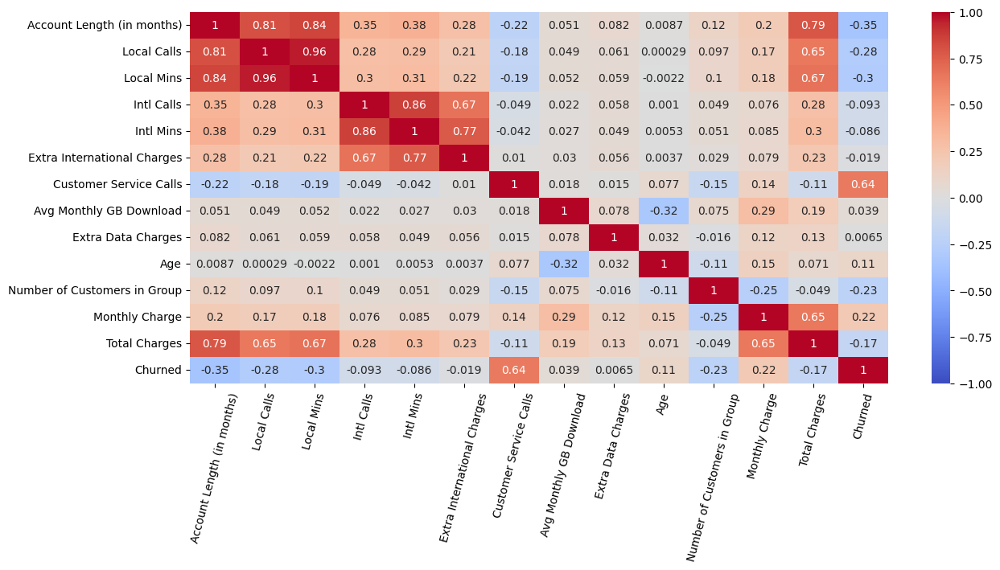

In [39]:
#Cross Correlation Analysis
fig, ax = plt.subplots(figsize=(14, 6))

sns.heatmap(df[num_vars].corr(), vmin=-1, vmax=1, annot=True, cmap="coolwarm")

plt.xticks(rotation=75)
plt.show()

In [40]:
# We want to extract the variables for which the correlation coefficient is above 0.6
# The columns will be stored as keys of a dictionary, and the coefs will be the values

# Computing the correlation matrix
corr_matrix = df[num_vars].corr()

# Creating an empty dictionary to store the results
correlation_dict = {}

# Looping through the correlation matrix and filtering values greater than 0.6
for col in corr_matrix.columns:
    for row in corr_matrix.index:
        # Checking if the absolute correlation is greater than 0.6 and the row is not the same as the column
        if abs(corr_matrix.loc[row, col]) > 0.6 and row != col:
            # Using a tuple of sorted row and col as the key, to avoid duplicate entries
            key = tuple(sorted([row, col]))  # This ensures that (row, col) and (col, row) are treated as the same
            correlation_dict[key] = round(abs(corr_matrix.loc[row, col]), 2)

# Displaying the dictionary
print("\n" ,correlation_dict, "\n")


 {('Account Length (in months)', 'Local Calls'): 0.81, ('Account Length (in months)', 'Local Mins'): 0.84, ('Account Length (in months)', 'Total Charges'): 0.79, ('Local Calls', 'Local Mins'): 0.96, ('Local Calls', 'Total Charges'): 0.65, ('Local Mins', 'Total Charges'): 0.67, ('Intl Calls', 'Intl Mins'): 0.86, ('Extra International Charges', 'Intl Calls'): 0.67, ('Extra International Charges', 'Intl Mins'): 0.77, ('Churned', 'Customer Service Calls'): 0.64, ('Monthly Charge', 'Total Charges'): 0.65} 



In [41]:
# Sorting the dictionary based on dict values
sorted_dict_desc = dict(sorted(correlation_dict.items(), key=lambda item: item[1], reverse=True))

# Printing dictionary keys
print("\n", sorted_dict_desc.keys(), "\n") 


 dict_keys([('Local Calls', 'Local Mins'), ('Intl Calls', 'Intl Mins'), ('Account Length (in months)', 'Local Mins'), ('Account Length (in months)', 'Local Calls'), ('Account Length (in months)', 'Total Charges'), ('Extra International Charges', 'Intl Mins'), ('Local Mins', 'Total Charges'), ('Extra International Charges', 'Intl Calls'), ('Local Calls', 'Total Charges'), ('Monthly Charge', 'Total Charges'), ('Churned', 'Customer Service Calls')]) 



**Insights & Recommendations**

- Call Usage & Charges: High correlations between call-related features (e.g., Local Calls ↔ Local Mins, Intl Calls ↔ Intl Mins) as well as correlation between call usage and charges (e.g., ('Local Calls', 'Total Charges')) indicate that heavy users contribute more to revenue but may face high charges, increasing churn risk.
Recommendation: Offer tiered pricing plans and retention strategies (e.g., discounts, value-added services) for high-usage customers.

- Account Length & Usage: Longer account durations correlate with higher call usage and total charges, suggesting engaged customers but potential dissatisfaction from overage charges.
Recommendation: Implement loyalty programs and review plans to ensure they match customer needs.

- Customer Service Calls & Churn: Frequent customer service interactions strongly predict churn, signaling dissatisfaction.
Recommendation: Flag high-contact customers for proactive issue resolution and identify recurring problems.

- Monthly Charge & Total Charges: Higher monthly charges lead to higher total charges, but customers may feel overcharged if usage does not match their plan.
Recommendation: Adjust pricing strategies to align with customer usage and prevent dissatisfaction.

- International Charges & Usage: High international call usage is linked to extra charges, which may lead to dissatisfaction.
Recommendation: Improve transparency in international pricing and offer bundled plans to reduce surprises.

**Actionable Business Strategies:**

- Target High-Usage Customers with personalized plans to prevent churn.
  
- Improve Customer Service by addressing frequent complaints proactively.

- Refine Pricing Strategies to better match customer consumption.

- Offer Competitive International Plans to attract heavy international users.

- Implement Loyalty Programs for long-term customers to enhance retention.

**Possible questions to investigate at this point:**

- Question1: Are customers with high usage and high charges more likely to churn due to overage fees or dissatisfaction with their plans?
- Question2: Do long-term customers have lower churn rates, or do they become vulnerable to dissatisfaction if their usage exceeds plan expectations?
- Question3: Can we reduce churn by proactively addressing frequent customer service issues before they escalate?
- Question4: Are customers who feel overcharged because their usage doesn't match their monthly charge more likely to churn?
- Question5: Do high international charges contribute to churn, and can we improve retention by offering clearer or more affordable international pricing plans?
- Question6: How can we leverage the combination of account length and total charges to predict potential churn or target long-term customers for retention?
- Question7: Would introducing more flexible or customized pricing plans reduce churn by offering customers better value based on their usage?
- Question8: How can we design loyalty programs that increase satisfaction and reduce churn, particularly among our long-term customers?
- Question9: How can we identify customers who might be at risk of churn due to this mismatch, and offer them personalized plans or pricing options?
- Question10: What are the most common reasons customers contact customer service, and how can we resolve these issues before they lead to churn?

**Correlations Visualization Through Scatter Plots**

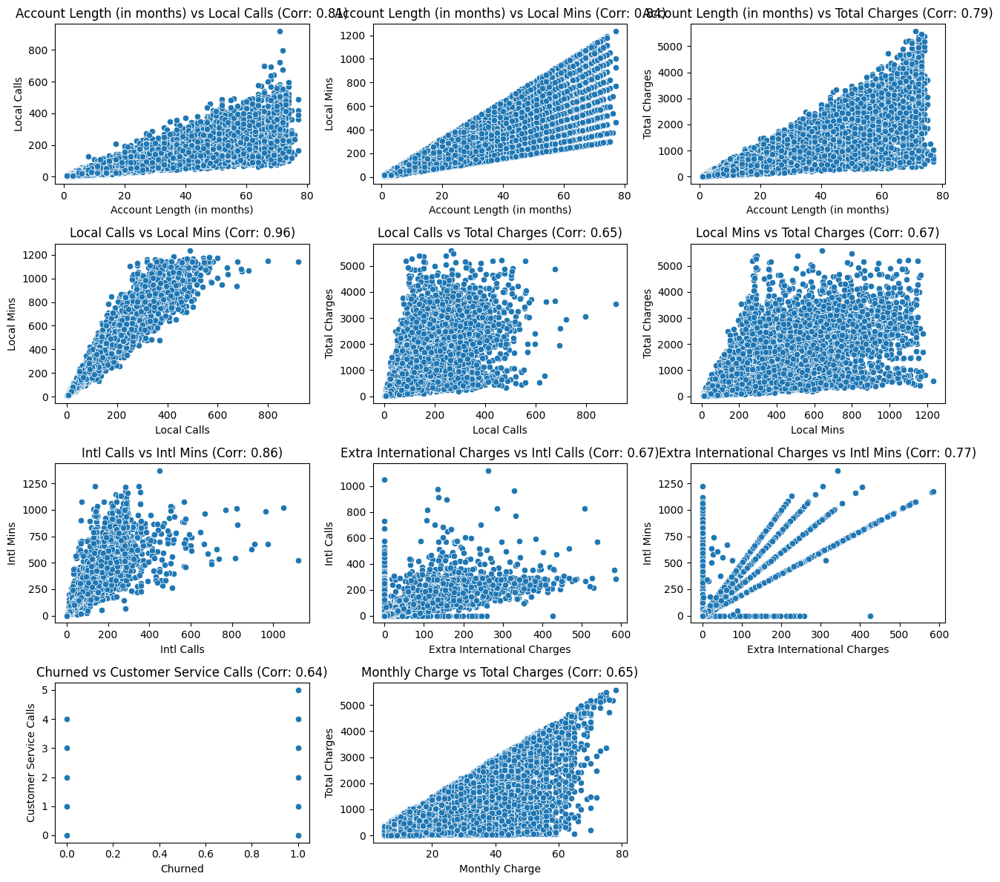

In [42]:
import math

# Calculating the number of rows required for 3 columns
num_plots = len(correlation_dict)  # The number of scatter plots needed
num_cols = 3  # 3 columns per row
num_rows = math.ceil(num_plots / num_cols)  # Rounding up to ensure all plots fit

# Creating a figure with the required number of rows and columns
fig, axes = plt.subplots(num_rows, num_cols, figsize=(13, 3 * num_rows))

# Flattenning the axes array to make it easier to iterate over
axes = axes.flatten()

# Looping through the dictionary and creating a scatter plot for each pair
for i, ((row, col), corr_value) in enumerate(correlation_dict.items()):
    ax = axes[i]  # Select the axis for the current plot
    sns.scatterplot(data=df, x=row, y=col, ax=ax)  # Create scatter plot on the selected axis
    ax.set_title(f'{row} vs {col} (Corr: {corr_value:.2f})')  # Set the title

# Removing any empty subplots (in case the number of plots is not a multiple of 3)
for j in range(num_plots, len(axes)):
    fig.delaxes(axes[j])

# Adjusting layout for better spacing
plt.tight_layout()
plt.show()

The only column (numerical) with a correlation of more than 0.6 with the Churned column is Customer Service Calls, this suggests that there is a strong relationship between the number of customer service calls and whether a customer churned.

**What can be inferred from this correlation?**

- This could suggest that customers who are unhappy with the service or are facing issues might be more likely to reach out for support. If their issues aren't resolved satisfactorily, they might decide to leave.

- A strong correlation might also suggest that customers who experience issues (e.g., billing problems, technical issues, or service dissatisfaction) are more likely to contact customer support. If the support experience is not positive, they may choose to churn.

**Standardization:**

*** I'm conducting another analysis of the correlation between all numerical columns and the 'Churned' column after applying standardization. I'm considering whether Z-score normalization might provide deeper insights.

In [43]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[num_vars])  # num_vars are the numeric columns
df_scaled = pd.DataFrame(scaled_data, columns=num_vars)

In [44]:
corr_matrix_scaled = df_scaled.corr()
print(corr_matrix_scaled['Churned'].sort_values(ascending=False)) # Checking correlations with Churned

Churned                         1.000000
Customer Service Calls          0.641714
Monthly Charge                  0.216554
Age                             0.108823
Avg Monthly GB Download         0.039453
Extra Data Charges              0.006545
Extra International Charges    -0.019114
Intl Mins                      -0.086001
Intl Calls                     -0.093483
Total Charges                  -0.174458
Number of Customers in Group   -0.225631
Local Calls                    -0.284178
Local Mins                     -0.296423
Account Length (in months)     -0.353436
Name: Churned, dtype: float64


The result confirms the strong correlation between Customer Service Calls and Churned column.

#### Non-Linear Correlation - Categorical Variables

**Evaluating correlation among categorical columns through decision tree feature importance:**

Feature importance indicates which features contribute the most to predicting the target variable, in this case, "Churned." While Pearson correlation is limited to numerical features, decision trees can handle both numerical and categorical features. Here, we apply this method on categorical columns.

In [45]:
# Select only categorical features
categorical_features = df.select_dtypes(include=["object"]).columns
X = df[categorical_features].drop(columns=["Churn Label", "Customer ID", "Phone Number"])
y = df["Churned"]  # Target variable

# Convert categorical features to numerical using factorize()
X_encoded = X.apply(lambda col: pd.factorize(col)[0])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Train a Decision Tree on categorical features
model = DecisionTreeClassifier(criterion="gini", random_state=42, class_weight="balanced")
model.fit(X_train, y_train)

# Get feature importance
feature_importance = pd.DataFrame({
    "Feature": X.columns,
    "Importance": model.feature_importances_
}).sort_values(by="Importance", ascending=False)

# Print feature importance
print(feature_importance[:3])

           Feature    Importance
11  Churn Category  1.000000e+00
7            Group  1.100231e-13
0      Intl Active  0.000000e+00


Having feature importance of 1 for Churn Category and 0 for the rest of the features shows an strong correlation between Churn Category and Churned and this also suggests that the model is using Churn Category as a shortcut. Which was expected as this variable directly points out the non-churned customers in Not Churned_C. 
To explore the rest of the categorical columns without being shadowed by Churn Category, we exclude this column from the columns list and repeat the process: 

In [46]:
# Select only categorical features
categorical_features = df.select_dtypes(include=["object"]).columns
X = df[categorical_features].drop(columns=["Churn Label", "Customer ID", "Phone Number", "Churn Category"])
y = df["Churned"]  # Target variable

# Convert categorical features to numerical using factorize()
X_encoded = X.apply(lambda col: pd.factorize(col)[0])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Train a Decision Tree on categorical features
model = DecisionTreeClassifier(criterion="gini", random_state=42, class_weight="balanced")
model.fit(X_train, y_train)

# Get feature importance
feature_importance = pd.DataFrame({
    "Feature": X.columns,
    "Importance": model.feature_importances_
}).sort_values(by="Importance", ascending=False)

# Print feature importance
print(feature_importance[:3])

                              Feature    Importance
11                       Churn Reason  1.000000e+00
8   Device Protection & Online Backup  1.100231e-13
0                         Intl Active  0.000000e+00


Having feature importance of 1 for Churn Reason and 0 for the rest of the features shows an strong correlation between Churn Reason and Churned and this also suggests that the model is using Churn Reason as a shortcut. Which was, again, an expected behavior since Churn Reason explicitly points out churned customers through Not Churned_R. 
To explore the rest of the categorical columns without being shadowed by Churn Reason, we exclude this column from the columns list and repeat the process: 

In [47]:
# Select only categorical features
categorical_features = df.select_dtypes(include=["object"]).columns
X = df[categorical_features].drop(columns=["Churn Label", "Customer ID", "Phone Number", "Churn Category", "Churn Reason"])
y = df["Churned"]  # Target variable

# Convert categorical features to numerical using factorize()
X_encoded = X.apply(lambda col: pd.factorize(col)[0])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Train a Decision Tree on categorical features
model = DecisionTreeClassifier(criterion="gini", random_state=42, class_weight="balanced")
model.fit(X_train, y_train)

# Get feature importance
feature_importance = pd.DataFrame({
    "Feature": X.columns,
    "Importance": model.feature_importances_
}).sort_values(by="Importance", ascending=False)

# Print feature importance
print(feature_importance)

                              Feature  Importance
9                       Contract Type    0.323452
3                               State    0.313805
7                               Group    0.058252
10                     Payment Method    0.051750
4                              Gender    0.045061
1                           Intl Plan    0.043451
8   Device Protection & Online Backup    0.040429
5                            Under 30    0.036249
6                              Senior    0.034495
0                         Intl Active    0.032098
2                 Unlimited Data Plan    0.020958


**Key Takeaways:**  
- Contract Type is a Key Churn Driver. Customers on month-to-month plans are at higher risk, suggesting that incentivizing longer-term contracts could improve retention.
  
- Regional Differences Matter. Churn varies by location, likely due to competition or service quality, meaning localized strategies may be necessary.
  
- Demographics Play a Minor Role. Unlike service-related factors, individual characteristics like gender and age have little impact on churn prediction.

- Churn Category & Churn Reason: Understanding why customers leave (e.g., dissatisfaction, price sensitivity, service issues) enables targeted retention efforts.

**Business Strategy:** 
Identifying key churn drivers enables targeted retention strategies, such as offering discounts to month-to-month contract holders or improving service in high-churn states.

**Validation of Hypotheses:** 
This analysis confirms whether assumed factors (like demographics) truly impact churn or if the focus should shift to contract types and regional factors.

<span style="font-size: 18px;">**Reasoning for Separation of Analysis Between Categorical & Numerical Features**

Separating numerical and categorical analyses allows us to apply the best-suited method to each type of data. Numerical features benefit from correlation analysis, which gives clear insights about their relationships, while categorical features are better suited to the decision tree approach that handles class-based segmentation and interaction between categories.

This approach helps in understanding and interpreting relationships in the data more effectively, without applying a one-size-fits-all technique that might not yield as useful or clear insights.

In summary, while a Decision Tree can be used for both numerical and categorical features, our approach of separating the analysis allows for a more tailored and efficient exploration of the data. Pearson correlation is ideal for uncovering simple linear relationships between numerical variables, while Decision Trees are well-suited for capturing non-linear, interaction-based relationships within categorical data. This combination ensures that each method is applied to the most appropriate feature type, enhancing the accuracy and interpretability of the analysis.

**Plotting Churn Category and Churn Reason to Have a Better Undrstanding of These Two Contributors:**

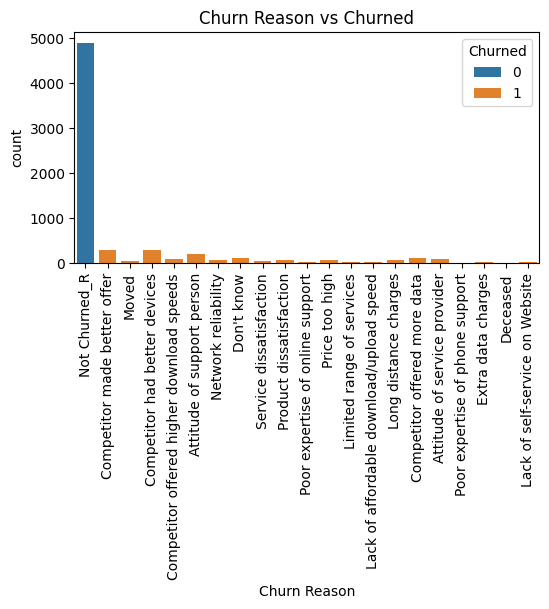

In [48]:
# Bar plot for categorical Churn Reason vs Churned
plt.figure(figsize=(6,3))
sns.countplot(x='Churn Reason', hue='Churned', data=df)
plt.title('Churn Reason vs Churned')

# Rotating the x-axis labels by 90 degrees
plt.xticks(rotation=90)
plt.show()

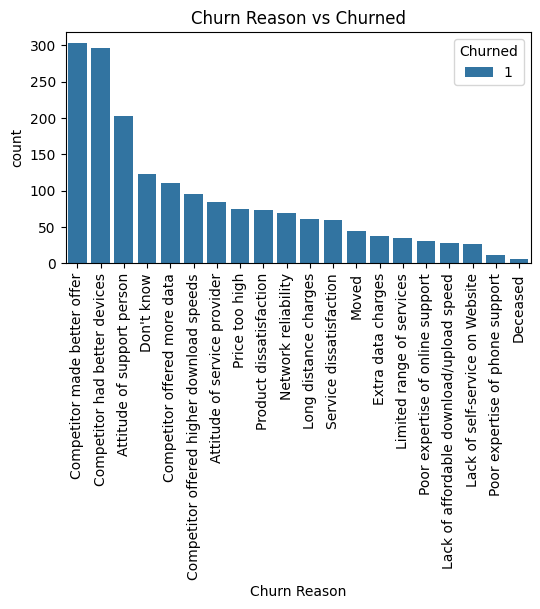

In [49]:
# Removing the 'Not Churned_R' Reason from the Churn Reason Column
df_filtered = df[df['Churn Reason'] != 'Not Churned_R']

# Sorting Churn Reason by count
sorted_order = df_filtered['Churn Reason'].value_counts().index

# Bar plot for categorical Churn Reason vs Churned
plt.figure(figsize=(6,3))
sns.countplot(x='Churn Reason', hue='Churned', data=df_filtered, order=sorted_order)

plt.title('Churn Reason vs Churned')

# Rotating the x-axis labels by 90 degrees
plt.xticks(rotation=90)

plt.show()

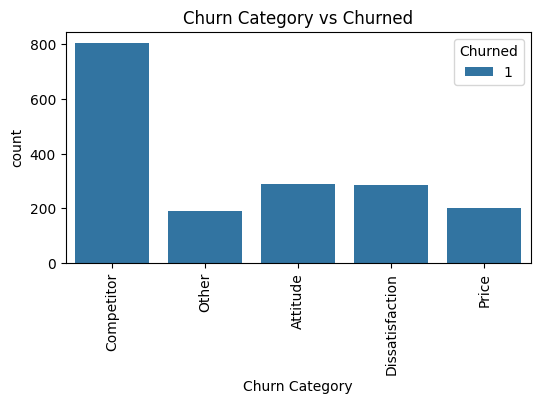

In [50]:
# Removing the 'no churned_C' Category from the Churn Category Column
df_filtered = df[df['Churn Category'] != 'Not Churned_C']

# Bar plot for categorical Churn Category vs Churned
plt.figure(figsize=(6,3))
sns.countplot(x='Churn Category', hue='Churned', data=df_filtered)
plt.title('Churn Category vs Churned')

# Rotating the x-axis labels by 90 degrees
plt.xticks(rotation=90)

plt.show()

Within these two factors, the leading category is Competitor, and the top reasons for churn are "Competitor made a better offer" and "Competitor had better devices."

# Insights Extraction & Actionable Solutions

This section uncovers key insights and practical solutions by exploring a diverse set of questions to analyze various churn drivers.

**Brief Statistical Tests Overview:**

The t-test is a statistical test used to compare the means of two groups and determine if there is a significant difference between them, typically used when the data is normally distributed. For example, in analyzing churn, a t-test could be used to compare the average "Account Length" between customers who churned versus those who didn't. 

The Mann-Whitney U test is similar to the t-test but is used when the data is not normally distributed, comparing the ranks of two independent groups instead of their means. For instance, if we want to compare "Total Charges" between churned and non-churned customers and the data is skewed, we would use the Mann-Whitney U test. 

The Chi-square test is used for categorical data to test the association between two variables. For example, it can be used to determine whether churn is associated with different customer segments, such as "Gender" or "Payment Method". While the t-test and Mann-Whitney U test are used for continuous variables, the Chi-square test is used for categorical variables. 

The main difference between the t-test and Mann-Whitney U test is that the t-test assumes normally distributed data, while the Mann-Whitney U test does not.

<span style="font-size: 18px;">**Question 1:** Are customers with high usage and high charges more likely to churn due to overage fees or dissatisfaction with their plans?

Churn rates for high usage and high charges:
high_usage_high_charges
False    0.279035
True     0.131796
Name: Churned, dtype: float64


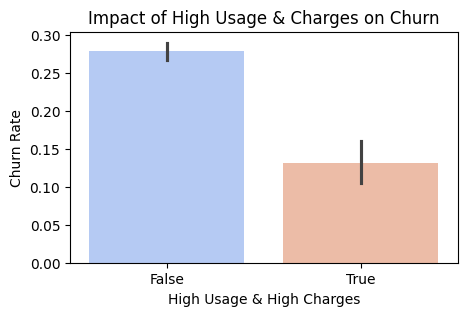

Chi-square test p-value: 7.13309483448477e-15
There is a statistically significant relationship between high usage, high charges, and churn.


In [51]:
from scipy.stats import chi2_contingency
from sklearn.preprocessing import KBinsDiscretizer

# Defining high usage and high charges
usage_threshold = df["Avg Monthly GB Download"].quantile(0.75)  # Upper 25%
charge_threshold = df["Total Charges"].quantile(0.75)  # Upper 25%

df["high_usage"] = df["Avg Monthly GB Download"] >= usage_threshold
df["high_charges"] = df["Total Charges"] >= charge_threshold

df["high_usage_high_charges"] = df["high_usage"] & df["high_charges"]

# Analyzing churn rates
churn_rates = df.groupby("high_usage_high_charges")["Churned"].mean()
print("Churn rates for high usage and high charges:")
print(churn_rates)

# Visualization
plt.figure(figsize=(5, 3))
sns.barplot(x=df["high_usage_high_charges"], y=df["Churned"], palette="coolwarm")
plt.xlabel("High Usage & High Charges")
plt.ylabel("Churn Rate")
plt.title("Impact of High Usage & Charges on Churn")
plt.show()

# Chi-square test for statistical significance
contingency_table = pd.crosstab(df["high_usage_high_charges"], df["Churned"])
chi2, p, _, _ = chi2_contingency(contingency_table)
print(f"Chi-square test p-value: {p}")

# Interpretation
if p < 0.05:
    print("There is a statistically significant relationship between high usage, high charges, and churn.")
else:
    print("No strong statistical evidence of a relationship between high usage, high charges, and churn.")

<span style="font-size: 18px;">**Insights:**

The results suggest that customers with high usage and high charges are actually less likely to churn (13.2%) compared to those with lower usage and charges (27.9%). This counterintuitive finding indicates that heavy users may be more engaged and reliant on the service, making them less likely to leave. Rather than being deterred by high costs, these customers may perceive the value in their plans or have fewer viable alternatives.

The extremely low p-value (7.13e-15) from the chi-square test confirms that the relationship between high usage, high charges, and churn is statistically significant. However, this does not necessarily imply causation. It is possible that high-usage customers are on premium plans with better perks, reducing dissatisfaction. Alternatively, the real issue may be customers with mid-to-high charges but lower-than-expected usage, who might feel overcharged relative to their actual consumption. A deeper segmentation analysis could help distinguish between those who willingly pay for high usage and those who feel unfairly billed, leading to targeted retention strategies.

<span style="font-size: 18px;">**Question 2:** Do long-term customers have lower churn rates, or do they become vulnerable to dissatisfaction if their usage exceeds plan expectations?

churn rate High Usage
False    0.121566
True     0.294979
Name: Churned, dtype: float64


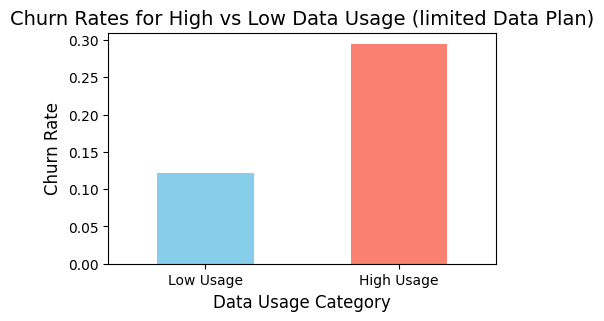

In [52]:
# Filtering out customers with Unlimited Data Plan
limited_data_customers = df[df['Unlimited Data Plan'] == 'No']

# Defining the 75th percentile for Avg Monthly Download for high usage (Upper 25%)
threshold = limited_data_customers['Avg Monthly GB Download'].quantile(0.75) 

# Creating a new column to indicate whether the customer exceeds the data usage threshold
limited_data_customers['High Usage'] = limited_data_customers['Avg Monthly GB Download'] > threshold

# Calculating churn rates for customers with high and low usage
churn_rate = limited_data_customers.groupby('High Usage')['Churned'].mean()

print("churn rate", churn_rate)

# Visualizeing the churn rates
plt.figure(figsize=(5,3))
churn_rate.plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Churn Rates for High vs Low Data Usage (limited Data Plan)', fontsize=14)
plt.xlabel('Data Usage Category', fontsize=12)
plt.ylabel('Churn Rate', fontsize=12)
plt.xticks([0, 1], ['Low Usage', 'High Usage'], rotation=0)
plt.show()

<span style="font-size: 18px;">**Insights:**

The results indicate that long-term customers with high usage have a significantly higher churn rate (29.5%) compared to those with lower usage (12.2%). This suggests that while long-term customers may generally be loyal, those whose usage exceeds their plan expectations are at a higher risk of dissatisfaction and churn. These customers may feel constrained by their current plans, experience unexpected overage fees, or perceive a lack of value compared to alternative options.

This pattern highlights a potential mismatch between long-term customer needs and their current plan offerings. To improve retention, companies could consider proactive plan adjustments, loyalty-based discounts, or flexible upgrades tailored to high-usage long-term customers. Additionally, early intervention strategies, such as personalized usage alerts or automatic plan recommendations, could help mitigate dissatisfaction before it leads to churn.

<span style="font-size: 18px;">**Question 3:** Can we reduce churn by proactively addressing frequent customer service issues before they escalate?

churn rate Frequent Service Calls
False    0.160526
True     0.956769
Name: Churned, dtype: float64


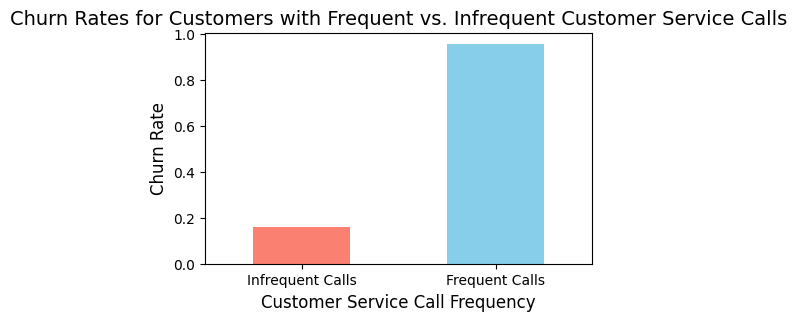

Chi-square p-value: 0.0


In [53]:
from scipy import stats

# Defining frequent customer service calls (3 or more calls)
df['Frequent Service Calls'] = df['Customer Service Calls']>=3

# Calculating churn rate for customers with frequent vs. infrequent customer service calls
churn_rate = df.groupby('Frequent Service Calls')['Churned'].mean()

print("churn rate", churn_rate)

# Performing a chi-square test to see if there is a significant difference in churn based on service calls
contingency_table = pd.crosstab(df['Frequent Service Calls'], df['Churned'])
chi2, p_value, _, _ = stats.chi2_contingency(contingency_table)

# Visualizing churn rates for frequent vs. infrequent service calls
plt.figure(figsize=(5,3))
churn_rate.plot(kind='bar', color=['salmon', 'skyblue'])
plt.title('Churn Rates for Customers with Frequent vs. Infrequent Customer Service Calls', fontsize=14)
plt.xlabel('Customer Service Call Frequency', fontsize=12)
plt.ylabel('Churn Rate', fontsize=12)
plt.xticks([0, 1], ['Infrequent Calls', 'Frequent Calls'], rotation=0)
plt.show()

# Printing the chi-square test result
print(f'Chi-square p-value: {p_value}')

<span style="font-size: 18px;">**Insights:**

The results show a drastic difference in churn rates between customers who make frequent service calls (95.7%) and those who do not (16.1%). This indicates a strong correlation between frequent customer service issues and churn, suggesting that unresolved or recurring problems significantly contribute to customer dissatisfaction.

Furthermore, the chi-squared test p-value of 0 confirms that the relationship between frequent service calls and churn is statistically significant. This reinforces the notion that addressing customer service issues proactively is essential to reduce churn.

Given this, proactively addressing customer service concerns before they escalate could be a highly effective churn reduction strategy. Implementing faster issue resolution, improved self-service options, and proactive outreach to dissatisfied customers could help mitigate churn. Additionally, predictive analytics could be used to identify at-risk customers based on their service interactions, allowing for targeted interventions such as personalized support or service improvements.



<span style="font-size: 18px;">**Question 4:** Are customers who feel overcharged because their usage doesn't match their monthly charge more likely to churn?

**Defining Overcharged Customers:**

A customer may feel "overcharged" if their usage (e.g., Avg Monthly GB Download) is low compared to the Monthly Charges. We can create a metric to define this "overcharge" situation, such as calculating the ratio of Avg Monthly Download to Monthly Charges.
If the ratio is low, it suggests the customer is paying a high price for a relatively low usage, which could lead to feelings of being overcharged.

churn rate Overcharged
False    0.316084
True     0.112991
Name: Churned, dtype: float64


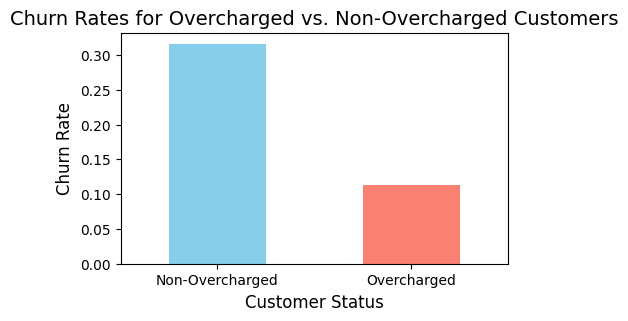

Chi-square p-value: 6.446326394586552e-59


In [54]:
from scipy import stats

# Calculating the ratio of Avg Monthly GB Download to Monthly Charges
df['Usage Charge Ratio'] = df['Avg Monthly GB Download'] / df['Monthly Charge']

# Defining overcharged customers (bottom 25% of the ratio)
threshold = df['Usage Charge Ratio'].quantile(0.25)
df['Overcharged'] = df['Usage Charge Ratio'] < threshold

# Calculating churn rate for overcharged vs. non-overcharged customers
churn_rate = df.groupby('Overcharged')['Churned'].mean()

print("churn rate", churn_rate)

# Performing a chi-square test to see if there is a significant difference in churn based on being overcharged
contingency_table = pd.crosstab(df['Overcharged'], df['Churn Label'])
chi2, p_value, _, _ = stats.chi2_contingency(contingency_table)

# Visualizing churn rates for overcharged vs. non-overcharged customers
plt.figure(figsize=(5,3))
churn_rate.plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Churn Rates for Overcharged vs. Non-Overcharged Customers', fontsize=14)
plt.xlabel('Customer Status', fontsize=12)
plt.ylabel('Churn Rate', fontsize=12)
plt.xticks([0, 1], ['Non-Overcharged', 'Overcharged'], rotation=0)
plt.show()

# Printing the chi-square test result
print(f'Chi-square p-value: {p_value}')

<span style="font-size: 18px;">**Insights:**

The results show that customers who feel overcharged due to their usage not matching their monthly charge have a significantly lower churn rate (11.3%) compared to those who do not feel overcharged (31.6%). This suggests that customers who perceive themselves as overcharged are less likely to churn.

The chi-squared p-value of 6.45e-59 indicates that there is a very strong and statistically significant relationship between feeling overcharged and churn. This could mean that customers who perceive they are paying more than their usage justifies may feel a sense of unfairness or frustration, but are more likely to stay with the service, possibly due to inertia or lack of better alternatives.

Given this, understanding the reasons behind customers' perceptions of being overcharged and addressing these issues through better pricing transparency, personalized plans, or usage-based pricing models could help to reduce churn and increase customer satisfaction. It may be beneficial to offer options for customers to better align their usage with their charges, such as flexible or customized pricing plans.

<span style="font-size: 18px;">**Question 5:** Do high international charges contribute to churn, and can we improve retention by offering clearer or more affordable international pricing plans?

churn rate High International Charges
False    0.241593
True     0.337740
Name: Churned, dtype: float64


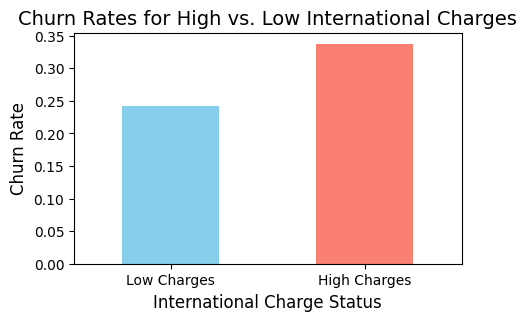

Chi-square p-value: 1.8704442854746553e-14


In [55]:
from scipy import stats

# Defining high international charges (top 25% of extra international charges)
threshold = df['Extra International Charges'].quantile(0.75)
df['High International Charges'] = df['Extra International Charges'] > threshold

# Calculating churn rate for high vs. low international charges
churn_rate = df.groupby('High International Charges')['Churned'].mean()

print("churn rate", churn_rate)

# Performing a chi-square test to see if there is a significant difference in churn based on international charges
contingency_table = pd.crosstab(df['High International Charges'], df['Churn Label'])
chi2, p_value, _, _ = stats.chi2_contingency(contingency_table)

# Visualizing churn rates for high vs. low international charges
plt.figure(figsize=(5,3))
churn_rate.plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Churn Rates for High vs. Low International Charges', fontsize=14)
plt.xlabel('International Charge Status', fontsize=12)
plt.ylabel('Churn Rate', fontsize=12)
plt.xticks([0, 1], ['Low Charges', 'High Charges'], rotation=0)
plt.show()

# Printing the chi-square test result
print(f'Chi-square p-value: {p_value}')

<span style="font-size: 18px;">**Insights:**

The analysis shows that customers with high international charges exhibit a higher churn rate (33.8%) compared to those with lower international charges (24.2%). This suggests that high international charges do contribute to churn, with customers potentially leaving due to dissatisfaction with the cost of international services.

The chi-squared p-value of 1.87e-14 indicates a strong and statistically significant relationship between high international charges and churn, reinforcing the idea that customers who incur higher costs for international calls or services are more likely to leave the service provider.

To improve retention, it would be beneficial to offer clearer pricing plans for international charges, along with more affordable options, such as discounted international call plans, international bundles, or pay-per-use models. Providing better transparency and options would likely reduce the frustration associated with high charges, potentially decreasing churn in this customer segment.

<span style="font-size: 18px;">**Question 6:** How can we leverage the combination of account length and total charges to predict potential churn or target long-term customers for retention?

***Note**: This question can be effectively addressed by implementing a churn rate prediction model, which will be covered in the next section. In this section, we will explore the answers using EDA.

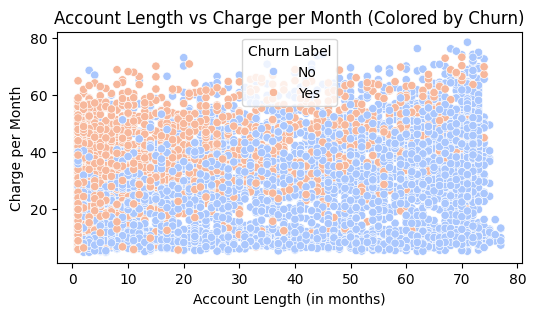

In [56]:
# Creating a new feature: Charge per Month
df['Charge per Month'] = df['Total Charges'] / df['Account Length (in months)']

# Visualizing the new feature with churn
plt.figure(figsize=(6,3))
sns.scatterplot(x='Account Length (in months)', y='Charge per Month', hue='Churn Label', data=df, palette='coolwarm')
plt.title('Account Length vs Charge per Month (Colored by Churn)')
plt.xlabel('Account Length (in months)')
plt.ylabel('Charge per Month')
plt.show()

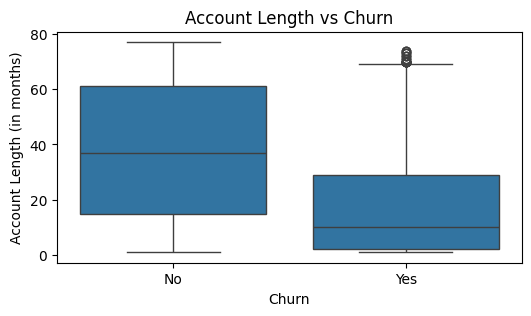

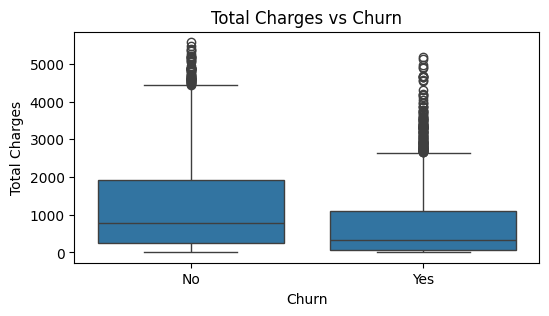

In [57]:
# Visualizing the relationship between Account Length and Churn
plt.figure(figsize=(6,3))
sns.boxplot(x='Churn Label', y='Account Length (in months)', data=df)
plt.title('Account Length vs Churn')
plt.xlabel('Churn')
plt.ylabel('Account Length (in months)')
plt.show()

# Visualizing the relationship between Total Charges and Churn
plt.figure(figsize=(6,3))
sns.boxplot(x='Churn Label', y='Total Charges', data=df)
plt.title('Total Charges vs Churn')
plt.xlabel('Churn')
plt.ylabel('Total Charges')
plt.show()

In [58]:
import scipy.stats as stats

# Descriptive statistics for Account Length by Churn
account_length_by_churn = df.groupby('Churn Label')['Account Length (in months)'].describe()
print("Descriptive Statistics for Account Length by Churn:\n", account_length_by_churn)

# Descriptive statistics for Total Charges by Churn
total_charges_by_churn = df.groupby('Churn Label')['Total Charges'].describe()
print("\nDescriptive Statistics for Total Charges by Churn:\n", total_charges_by_churn)

# Mann-Whitney U Test for Account Length (since the data is not normally distributed as we analyzed before)
account_length_churned = df[df['Churn Label'] == 'Yes']['Account Length (in months)']
account_length_non_churned = df[df['Churn Label'] == 'No']['Account Length (in months)']
u_stat_account_length, p_val_account_length = stats.mannwhitneyu(account_length_churned, account_length_non_churned)

# Mann-Whitney U Test for Total Charges (since the data is not normally distributed as we analyzed before)
total_charges_churned = df[df['Churn Label'] == 'Yes']['Total Charges']
total_charges_non_churned = df[df['Churn Label'] == 'No']['Total Charges']
u_stat_total_charges, p_val_total_charges = stats.mannwhitneyu(total_charges_churned, total_charges_non_churned)

# Printing statistical test results
print("\nMann-Whitney U Test for Account Length:")
print("U-statistic:", u_stat_account_length)
print("p-value:", p_val_account_length)

print("\nMann-Whitney U Test for Total Charges:")
print("U-statistic:", u_stat_total_charges)
print("p-value:", p_val_total_charges)


Descriptive Statistics for Account Length by Churn:
               count       mean        std  min   25%   50%   75%   max
Churn Label                                                           
No           4891.0  37.576569  24.174502  1.0  15.0  37.0  61.0  77.0
Yes          1769.0  17.882419  19.497151  1.0   2.0  10.0  29.0  74.0

Descriptive Statistics for Total Charges by Churn:
               count         mean          std  min    25%    50%     75%  \
Churn Label                                                                
No           4891.0  1202.117972  1156.950403  6.0  259.0  778.0  1932.0   
Yes          1769.0   756.749576   969.988891  6.0   59.0  335.0  1099.0   

                max  
Churn Label          
No           5574.0  
Yes          5172.0  

Mann-Whitney U Test for Account Length:
U-statistic: 2239751.0
p-value: 2.7175201003081026e-199

Mann-Whitney U Test for Total Charges:
U-statistic: 3117112.0
p-value: 3.7425258450681255e-68


<span style="font-size: 18px;">**Insights:**

The descriptive statistics for Account Length show that non-churned customers have a higher average account length (mean = 37.58 months) compared to churned customers (mean = 17.88 months). The standard deviation for non-churned customers (24.17 months) is also much larger than for churned customers (19.50 months), indicating greater variability in account length for non-churned customers. The minimum value for both groups is 1 month, but churned customers tend to have shorter account lengths, with the 75th percentile at 29 months compared to 61 months for non-churned customers. This suggests that customers who stay longer tend to have a higher likelihood of not churning.

For Total Charges, the mean for non-churned customers is significantly higher (1202.12) than for churned customers (756.75), with a wider range in total charges for non-churned customers (min = 6, max = 5574) compared to churned customers (min = 6, max = 5172). The standard deviation for total charges is also higher for non-churned customers (1156.95) than for churned ones (969.99), indicating a wider distribution of total charges among non-churned customers.

The Mann-Whitney U test results for both Account Length and Total Charges show extremely low p-values (2.72e-199 for Account Length and 3.74e-68 for Total Charges), indicating that the differences between churned and non-churned customers in both account length and total charges are statistically significant. The test confirms that account length and total charges are indeed different between the two groups, providing strong evidence that these factors are associated with churn.

<span style="font-size: 18px;">**Question 7:** Would introducing more flexible or customized pricing plans reduce churn by offering customers better value based on their usage?

Here again, this question can be effectively addressed by implementing a churn rate prediction model, which will be covered in the next section. In this section, we will explore the answers through EDA.

*Defining the Hypothesis:*
The hypothesis is that customers who feel they are overcharged based on their usage are more likely to churn. By introducing flexible or customized pricing plans, customers would get a better value for their usage, reducing churn.


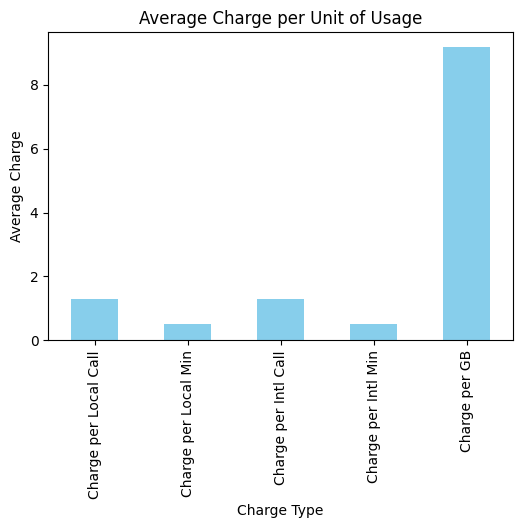

In [59]:
# Calculating charge per unit of usage (e.g., per minute of calls or per GB of download)
df['Charge per Local Call'] = df['Monthly Charge'] / df['Local Calls'].replace(0, np.nan)  # Avoid division by zero
df['Charge per Local Min'] = df['Monthly Charge'] / df['Local Mins'].replace(0, np.nan)  # Avoid division by zero
df['Charge per Intl Call'] = df['Monthly Charge'] / df['Intl Calls'].replace(0, np.nan)  # Avoid division by zero
df['Charge per Intl Min'] = df['Monthly Charge'] / df['Intl Mins'].replace(0, np.nan)  # Avoid division by zero
df['Charge per GB'] = df['Monthly Charge'] / df['Avg Monthly GB Download'].replace(0, np.nan)  # Avoid division by zero

# Creating a bar plot for the mean values of each charge per unit of usage
charge_columns = ['Charge per Local Call', 'Charge per Local Min', 'Charge per Intl Call', 'Charge per Intl Min', 'Charge per GB']
mean_charges = df[charge_columns].mean()

# Plotting
plt.figure(figsize=(6,4))
mean_charges.plot(kind='bar', color='skyblue')
plt.title('Average Charge per Unit of Usage')
plt.xlabel('Charge Type')
plt.ylabel('Average Charge')
plt.xticks(rotation=90)
plt.show()

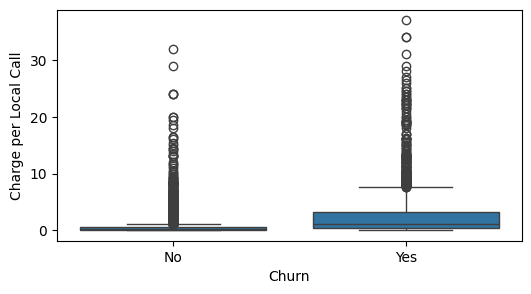

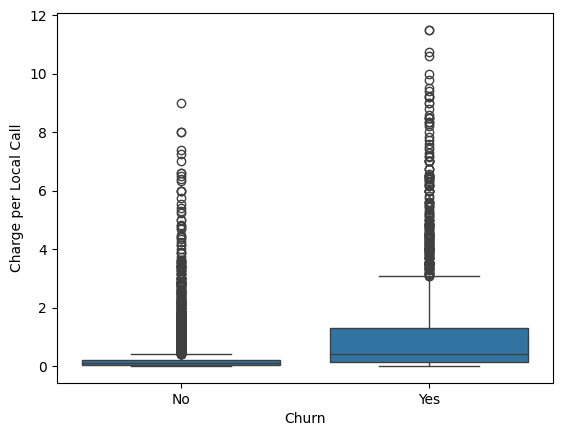

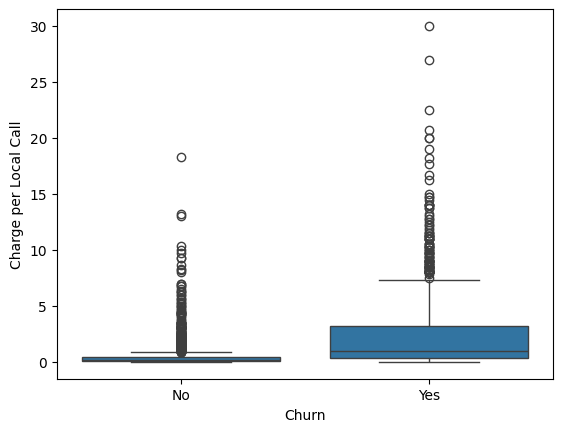

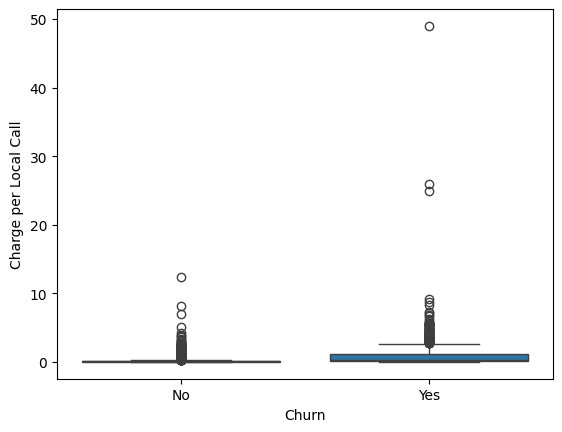

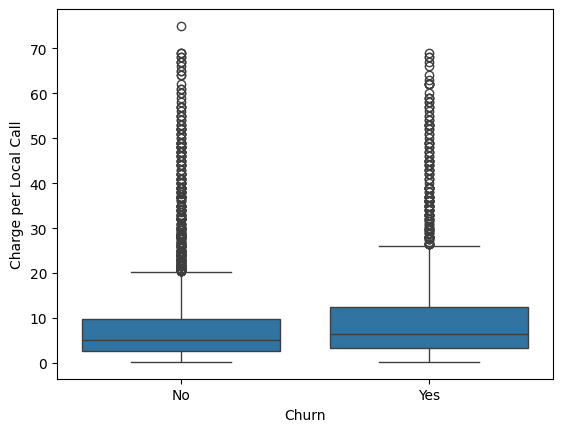

In [60]:
# Visualizing how 'Charge per Local Call' correlates with churn

charge_columns = ['Charge per Local Call', 'Charge per Local Min', 'Charge per Intl Call', 'Charge per Intl Min', 'Charge per GB']

plt.figure(figsize=(6,3))

for col in charge_columns:

    sns.boxplot(x='Churn Label', y=col, data=df)
    #plt.title(col)
    plt.xlabel('Churn')
    plt.ylabel('Charge per Local Call')
    plt.show()

In [61]:
# Calculating the mean, median, std, min, max for the charge per unit of usage
charge_columns = ['Charge per Local Call', 'Charge per Local Min', 'Charge per Intl Call', 'Charge per Intl Min', 'Charge per GB']

# Generating descriptive statistics
charge_stats = df[charge_columns].describe()

# Showing the statistics for each charge type
print(charge_stats)

# Calculating the correlation between charge types and churn
# Using 'Churned' to have a binary column (instead of "Churn Label" with Yes/No values)
correlations = df[charge_columns + ['Churned']].corr()

# Displaying the correlation matrix
print("\nCorrelation between charges and churn:")
print(correlations)

       Charge per Local Call  Charge per Local Min  Charge per Intl Call  \
count            6660.000000           6660.000000           2558.000000   
mean                1.299592              0.503181              1.286449   
std                 3.016642              1.111296              2.632665   
min                 0.011009              0.005160              0.007812   
25%                 0.139220              0.056757              0.142857   
50%                 0.301140              0.119557              0.300862   
75%                 0.900000              0.354016              1.000000   
max                37.000000             11.500000             30.000000   

       Charge per Intl Min  Charge per GB  
count          2558.000000    5178.000000  
mean              0.520446       9.189213  
std               1.559715      10.757436  
min               0.006116       0.241379  
25%               0.054149       2.875000  
50%               0.110054       5.550505  
75%    

<span style="font-size: 18px;">**Insights:**

The descriptive statistics for the charge per usage type show considerable variation in charges, with the highest charges for local calls and international minutes (up to 37 and 49, respectively). The mean charges indicate that, on average, local calls and international calls are priced higher compared to local and international minutes or data usage. The spread (standard deviation) in charges is also notably high for local calls and international calls, indicating significant differences in charges among customers.

The correlation matrix reveals that the charges for local calls and local minutes are highly correlated (0.96), and international calls and international minutes are also significantly correlated (0.62 and 0.52, respectively). When examining the relationship with churn, there are moderate positive correlations between charges (particularly for local and international calls) and churn, especially for local calls (0.33) and international calls (0.38). However, charges per GB show a very weak correlation with churn (0.09), suggesting that pricing for data usage may not be as impactful in driving churn as charges for calls. This insight suggests that addressing call charges, particularly local and international, may have a more significant impact on reducing churn.

Recommendations:

Flexible Pricing Plans: 
When customers with high charges relative to their usage are churning at higher rates, introducing flexible pricing plans based on usage (e.g., pay-as-you-go, tiered pricing) could reduce churn. This way, customers will feel they are paying a fair price for their usage.

Customized Plans: 
When customers with low usage but high charges are at risk of churning, customized pricing (such as offering discounts or adjusting the plan) could prevent churn. This would ensure that customers are not paying more than they need based on their actual usage.


<span style="font-size: 18px;">**Question 8:** How can we design loyalty programs that increase satisfaction and reduce churn, particularly among our long-term customers?

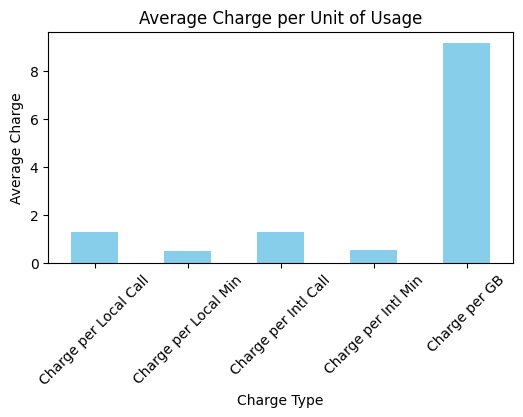

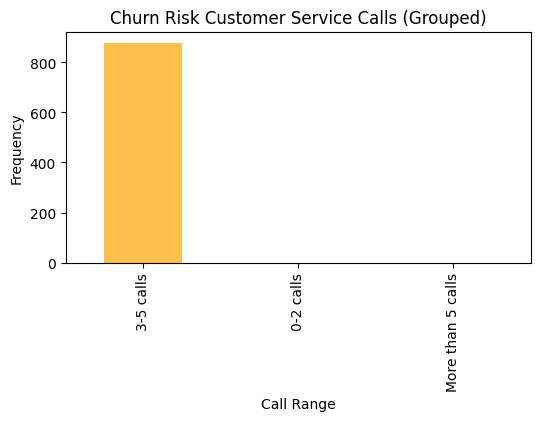

Rewards for Heavy Data Users:
   Customer ID          Personalized Reward
7    8787-QZUC  Extra Data or Data Rollover
11   1133-QYCQ  Extra Data or Data Rollover
13   6070-AXDL  Extra Data or Data Rollover
15   4633-QIYZ  Extra Data or Data Rollover
22   1380-YANO  Extra Data or Data Rollover
Rewards for High Intl Call Users:
   Customer ID              Personalized Reward
3    1314-SMPJ  Discount on International Calls
4    2956-TXCJ  Discount on International Calls
24   4676-RXAH  Discount on International Calls
44   6076-RCCT  Discount on International Calls
45   0476-UFII  Discount on International Calls
Long-Term Customer Rewards:
   Customer ID                              Reward Level
1   5676-PTZX            Gold - VIP Support + Discounts
2   8532-ZEKQ            Gold - VIP Support + Discounts
4   2956-TXCJ            Gold - VIP Support + Discounts
5   9152-DEPY  Silver - Discount on International Calls
6   1958-SDSO            Gold - VIP Support + Discounts


In [62]:
# Step 1: Identifying Long-Term Customers (customers with more than 12 months of tenure)
long_term_customers = df[df['Account Length (in months)'] > 12]

# Step 2: Offering Tailored Benefits Based on Usage Patterns
# Identifying heavy data users (those in the top 25% for Avg Monthly Download)
heavy_data_users = df[df['Avg Monthly GB Download'] > df['Avg Monthly GB Download'].quantile(0.75)]

# Identifying high international call users
high_intl_call_users = df[df['Intl Calls'] > df['Intl Calls'].quantile(0.75)]

# Step 3: Analyzing Customer Service Calls to Identify Potential Churn Risk
# Customers with frequent customer service calls (e.g., more than 2 calls)
churn_risk_customers = df[df['Customer Service Calls'] > 2]

# Step 4: Proposing Rewards for Long-Term Customers
# For this example, we’ll create a new column for rewards eligibility
# Assigning different rewards based on Account Length
def assign_rewards(row):
    if row['Account Length (in months)'] > 24:
        return 'Gold - VIP Support + Discounts'
    elif row['Account Length (in months)'] > 12:
        return 'Silver - Discount on International Calls'
    else:
        return 'Bronze - Regular Customer Support'

long_term_customers['Reward Level'] = long_term_customers.apply(assign_rewards, axis=1)

# Step 5: Checking if Data Charges (per unit) Are High Relative to Usage
df['Charge per Local Call'] = df['Monthly Charge'] / df['Local Calls'].replace(0, np.nan)  # Avoid division by zero
df['Charge per Local Min'] = df['Monthly Charge'] / df['Local Mins'].replace(0, np.nan)  # Avoid division by zero
df['Charge per Intl Call'] = df['Monthly Charge'] / df['Intl Calls'].replace(0, np.nan)  # Avoid division by zero
df['Charge per Intl Min'] = df['Monthly Charge'] / df['Intl Mins'].replace(0, np.nan)  # Avoid division by zero
df['Charge per GB'] = df['Monthly Charge'] / df['Avg Monthly GB Download'].replace(0, np.nan)  # Avoid division by zero

# Step 6: Visualization of the Charges Per Unit of Usage for Analysis
charge_columns = ['Charge per Local Call', 'Charge per Local Min', 'Charge per Intl Call', 'Charge per Intl Min', 'Charge per GB']
mean_charges = df[charge_columns].mean()

plt.figure(figsize=(6,3))
mean_charges.plot(kind='bar', color='skyblue')
plt.title('Average Charge per Unit of Usage')
plt.xlabel('Charge Type')
plt.ylabel('Average Charge')
plt.xticks(rotation=45)
plt.show()

# Step 7: Tracking the Effectiveness of Loyalty Programs (Hypothetical Metrics)
# For example, measuring churn rate before and after loyalty programs are implemented 
# For now, we just track churn risk customers

# Grouping customer service calls into custom bins
bins = [0, 2, 5, 10]  # Adjust the upper limit to a suitable number
labels = ['0-2 calls', '3-5 calls', 'More than 5 calls']
churn_risk_customers['Service Call Bins'] = pd.cut(churn_risk_customers['Customer Service Calls'], bins=bins, labels=labels, right=True)

# Visualizing churn risk based on grouped customer service calls
plt.figure(figsize=(6,3))
churn_risk_customers['Service Call Bins'].value_counts().plot(kind='bar', color='orange', alpha=0.7)
plt.title('Churn Risk Customer Service Calls (Grouped)')
plt.xlabel('Call Range')
plt.ylabel('Frequency')
plt.show()

# Step 8: Personalized Loyalty Rewards (Based on Usage Patterns)
# Example: Heavy data users (with more than 75th percentile of usage) might get discounts on data
heavy_data_users['Personalized Reward'] = 'Extra Data or Data Rollover'

# Example: International call heavy users might get discounts on international charges
high_intl_call_users['Personalized Reward'] = 'Discount on International Calls'

# Displaying rewards for high usage customers
print(f"Rewards for Heavy Data Users:\n{heavy_data_users[['Customer ID', 'Personalized Reward']].head()}")
print(f"Rewards for High Intl Call Users:\n{high_intl_call_users[['Customer ID', 'Personalized Reward']].head()}")

# Loyalty Programs for Long-Term Customers
print("Long-Term Customer Rewards:\n", long_term_customers[['Customer ID', 'Reward Level']].head())

<span style="font-size: 18px;">**Insights:**

1. Charges Per Unit of Usage:

The tallest bar in the graph represents "Charge per GB," which is significantly higher than the other charges per unit (e.g., for local and international calls). This suggests that data usage (in terms of GB download) is being charged at a relatively higher rate than other services like local calls or international calls. This could indicate that the company charges more for data-heavy services.

The "Charge per Local Min," "Charge per Intl Min," and "Charge per Local Call" are relatively in the same range height-wise, but lower than "Charge per GB." This may suggest that, for typical users, the monthly charges for calls are more predictable and less expensive compared to data usage.

2. Churn Risk Based on Customer Service Calls:

The "3-5 calls" group has the tallest bar, while the other two groups (0-2 calls and More than 5 calls) are barely visible. This indicates that customers who call customer service between 3 to 5 times are at a higher churn risk. This could be a sign of dissatisfaction, as frequent calls to customer service may signal unresolved issues or dissatisfaction with the service.

The lack of visibility for the other two bins suggests that most of the customers in the dataset fall into the "3-5 calls" range. Very few calls could imply low engagement or no issues, while frequent calls (more than 5) could indicate serious ongoing issues or customers already in the churn phase.
We need to focus on improving the experience for customers in the "3-5 calls" range, as they make up the largest group. It might be helpful to further investigate the reasons for their calls to customer service (e.g., through surveys or feedback).

3. Rewards for Heavy Data Users:

All of the heavy data users (those in the top 25% for Avg Monthly GB Download) are receiving the reward "Extra Data or Data Rollover." These customers are likely to appreciate rewards that cater to their data usage. Offering extra data or data rollover helps to increase customer retention by offering more value for their high usage.

4. Rewards for High International Call Users:

The high international call users are all receiving the reward "Discount on International Calls." This reward seems well-suited for international-heavy customers, who will benefit from lower international call charges. This could improve customer retention for a specific segment. Like the heavy data users, international-heavy users are being targeted with rewards tailored to their needs. 


5. Long-Term Customer Rewards:

Gold level: "VIP Support + Discounts" for customers with accounts over 24 months.
Silver level: "Discount on International Calls" for customers with accounts between 12 and 24 months.
Bronze level: Regular customer support for accounts under 12 months.
These reward levels are structured based on tenure, with more benefits given to long-term customers (e.g., Gold customers). This tiered reward structure is a good way to encourage customer retention by offering better rewards as customers stay longer with the company. It ensures that long-term customers feel valued and incentivized to stay longer.

# Churn Rate Forecasting 

## Overview

Forecasting churn rate is crucial for businesses as it helps predict which customers are likely to leave, allowing companies to proactively retain them by offering personalized incentives or interventions. This enables more targeted marketing efforts, optimized resource allocation, and improved customer loyalty strategies. 

To enhance the efficiency and performance of a churn prediction model, several considerations should be taken into account:

**Handling Class Imbalance** – Since churn is often a minority class, methods like SMOTE (Synthetic Minority Over-sampling Technique), undersampling, or cost-sensitive learning can help balance the dataset and improve prediction accuracy.

**Feature Selection** – Using methods such as SHAP values, mutual information, or recursive feature elimination (RFE) can help retain only the most relevant features, reducing noise and improving model interpretability.

**Hyperparameter Tuning** – Optimizing model parameters using techniques like grid search, random search, or Bayesian optimization can enhance performance.

**Ensemble Learning** – Combining multiple models, such as Random Forest, Gradient Boosting (XGBoost, LightGBM), and Neural Networks, can improve predictive accuracy and robustness.

**Time-Based Features** – Including trends like customer service call frequency over time, month-over-month usage changes, or seasonal patterns can provide deeper insights into churn behavior.

**Regularization** – Techniques like L1 (Lasso) and L2 (Ridge) regularization help prevent overfitting while improving model generalization.

**Threshold Optimization** – Instead of using a default 0.5 probability cutoff, adjusting the classification threshold based on precision-recall trade-offs can better capture churners.

**Behavioral Segmentation** – Clustering customers into behavioral segments (e.g., high-value vs. low-value customers) and using separate models per segment can lead to more precise predictions.

<span style="font-size: 22px;">**Handling Imbalanced Dataset:**

We have an imbalanced dataset, meaning in our dataset, one class (churners) is significantly underrepresented compared to the other class (customers who do not churn), which can lead to biased predictions if not handled properly.
There are a few strategies and models that can help improve the performance of our model. Here are some approaches:

**1. Resampling Techniques:**
Oversampling the minority class (churned customers) using methods like SMOTE (Synthetic Minority Over-sampling Technique).
Undersampling the majority class (non-churned customers), though this may lead to losing valuable data.

**2. Class Weight Adjustment:**)
Many machine learning algorithms (such as Logistic Regression, Random Forests, Gradient Boosting Machines) allow us to assign different weights to the classes. We can set a higher weight for the minority class (churned customers) to make the model pay more attention to predicting this class.

**3. Algorithms for Imbalanced Data:**

- *Random Forest or XGBoost (Gradient Boosting Models):* These are ensemble models that can handle imbalanced data well when class weights are adjusted.
  
- *Logistic Regression with class weights:* This method can work well with imbalanced datasets and provides probabilities, which can be useful when setting thresholds for classification.
  
- *LightGBM:* Another gradient boosting method optimized for performance and scalability with imbalanced datasets.

- *CatBoost:* A boosting method similar to XGBoost and LightGBM but with automatic handling of categorical variables.

**4. Evaluation Metrics:**
Accuracy is not a good metric for imbalanced datasets. Instead, we need to focus on:
Precision, Recall, and F1-Score (especially for the churned class).
ROC-AUC or PR-AUC (Precision-Recall AUC), which is a better indicator of performance with imbalanced classes.

**5. Threshold Moving:**
Once our model is trained, we can adjust the classification threshold to better predict the minority class. The default threshold for most models is 0.5, but moving this threshold can improve the recall of the minority class (churned).
Model Recommendations:

- *Random Forest Classifier:* Robust, works well with imbalanced data by adjusting class weights.
  
- *XGBoost:* Often performs well on imbalanced datasets due to its ensemble nature and ability to handle class weights.

- *Logistic Regression with class weights:* Simple yet effective, especially when combined with resampling techniques.

- *LightGBM and CatBoost:* Excellent alternatives that tend to outperform other models on large datasets.


<span style="font-size: 18px;">**Chosen Solution for the Task at Hand:**

Here, we work with CatBoost for the following reasons: its efficient handling of categorical features, robustness to overfitting, excellent performance on imbalanced data, fast training speed, and high accuracy. Additionally, its intuitive API and built-in support for cross-validation make it a great choice for the task at hand.

<span style="font-size: 16px;">  **Note**

When using CatBoost, both numerical and categorical features can be provided, and CatBoost will handle them appropriately. It is sufficient to specify which features are categorical by passing their indices or column names when initializing the model. However, in this case, the categorical and numerical features have been separated for thorough preprocessing, as this format is commonly accepted by most machine learning models. This approach also simplifies the process of experimenting with other models if needed.

## Preprocessing

In [63]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report
from catboost import CatBoostClassifier
from sklearn.model_selection import RandomizedSearchCV, cross_val_score

# Defining target and features 
# To eliminate any influence from previous analyses, we explicitly define the column names
target = "Churned" 
X = df[["Under 30", "Senior", "Gender", "Contract Type", "Payment Method","Group", "Intl Plan", "Intl Active", "Unlimited Data Plan"\
,"Account Length (in months)", "Age", "Number of Customers in Group", "Local Calls", "Local Mins", "Intl Calls", "Intl Mins", \
"Extra International Charges","Customer Service Calls", "Avg Monthly GB Download", "Monthly Charge", "Total Charges"]]
y = df[target]

# Identifying categorical and numerical features
categorical_features = ["Under 30", "Senior", "Gender", "Contract Type", "Payment Method", \
                        "Group", "Intl Plan", "Intl Active", "Unlimited Data Plan"]

numerical_features = ["Account Length (in months)", "Age", "Number of Customers in Group",
                      "Local Calls", "Local Mins", "Intl Calls", "Intl Mins", "Extra International Charges", 
                      "Customer Service Calls", "Avg Monthly GB Download", "Monthly Charge", "Total Charges"]

# Preprocessing pipeline
categorical_transformer = OneHotEncoder(handle_unknown="ignore", sparse_output=False)
numerical_transformer = StandardScaler()

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numerical_transformer, numerical_features),
        ("cat", categorical_transformer, categorical_features)
    ]
)

# Applying preprocessing before SMOTE
X_preprocessed = preprocessor.fit_transform(X)

# Converting back to DataFrame
X_preprocessed_df = pd.DataFrame(X_preprocessed, columns=preprocessor.get_feature_names_out())

# Splitting data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_preprocessed_df, y, test_size=0.2, stratify=y, random_state=42)

# Handling imbalance using SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

## Modeling

This step includes modeling, cross validation and hyperparameter tunning. 

Below,
- We use 5-fold cross-validation using F1-score as the evaluation metric. Cross-validation ensures robust performance estimation.
- The model is then trained on the full X_train_resampled dataset and tested on X_test.
- RandomizedSearchCV efficiently searches a subset of hyperparameters instead of an exhaustive grid search.
- Best model selection is done based on the f1 score.
- Final training is done using the best hyperparameters.

In [64]:
# Defining the CatBoost classifier
clf = CatBoostClassifier(random_state=42, verbose=0)

# Defining the hyperparameter grid
param_dist = {
    'iterations': [100, 300, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'depth': [4, 6, 8, 10],
    'l2_leaf_reg': [1, 3, 5, 7],
    'border_count': [32, 64, 128]
}

# Performing Randomized Search
random_search = RandomizedSearchCV(
    estimator=clf, 
    param_distributions=param_dist, 
    n_iter=20,  # Number of random combinations to try
    scoring='f1', 
    cv=5, 
    random_state=42, 
    n_jobs=-1
)

# Fitting RandomizedSearchCV
random_search.fit(X_train_resampled, y_train_resampled)

# Printing best hyperparameters
print("Best hyperparameters:", random_search.best_params_)

# Training the best model on the full training set
best_clf = random_search.best_estimator_
best_clf.fit(X_train_resampled, y_train_resampled)

# Making predictions
y_pred = best_clf.predict(X_test)

Best hyperparameters: {'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 300, 'depth': 10, 'border_count': 32}


## Feature Importance

                              Feature  Importance
8         num__Customer Service Calls   22.906177
10                num__Monthly Charge    9.319273
1                            num__Age    8.578854
9        num__Avg Monthly GB Download    6.760425
7    num__Extra International Charges    5.909057
19  cat__Contract Type_Month-to-Month    5.361417
0     num__Account Length (in months)    4.387760
22    cat__Payment Method_Credit Card    3.480039
11                 num__Total Charges    3.436613
4                     num__Local Mins    2.931534
17                   cat__Gender_Male    2.847015
3                    num__Local Calls    2.721594
16                 cat__Gender_Female    2.560944
23   cat__Payment Method_Direct Debit    2.175709
5                     num__Intl Calls    2.047002
6                      num__Intl Mins    1.395437
31        cat__Unlimited Data Plan_No    1.391731
29                cat__Intl Active_No    1.388688
32       cat__Unlimited Data Plan_Yes    1.363391


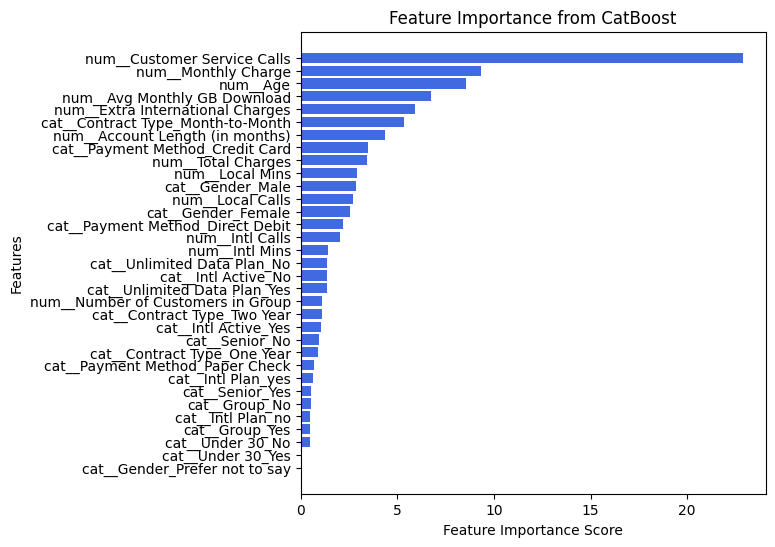

In [67]:
# Extracting feature importance
feature_importance = best_clf.get_feature_importance()
feature_names = X_train_resampled.columns  # Assuming X_train_resampled is a DataFrame

# Creating a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

# Printing the top features
print(feature_importance_df)

# Plotting feature importance
plt.figure(figsize=(6,6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='royalblue')
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title('Feature Importance from CatBoost')

# Displaying the highest importance at the top
plt.gca().invert_yaxis() 
plt.show()

<span style="font-size: 18px;">**Top 3 Contributing Factors to Customer Churn**

The results reveal that the top three factors driving churn are 'Number of Customer Service Calls,' 'Monthly Charge,' and 'Age,' in that order.

## Evaluation

In [66]:
# Evaluating performance
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.92      0.94      0.93       978
           1       0.81      0.76      0.79       354

    accuracy                           0.89      1332
   macro avg       0.86      0.85      0.86      1332
weighted avg       0.89      0.89      0.89      1332



## Result Analysis

<span style="font-size: 22px;">**Technical Analysis of the CatBoost Classifier Results:**

**Best Hyperparameters Interpretation:**

*Learning rate = 0.2* → The model updates weights relatively aggressively, which may lead to faster convergence but could risk overfitting if too high.
*L2 Leaf Regularization = 3* → Moderate regularization helps prevent overfitting.
*Iterations = 300* → A reasonable number of boosting rounds, balancing training time and performance.
*Depth = 10* → Deep trees capture complex patterns but may overfit if not well-regularized.
*Border count = 32* → Defines the number of splits for numerical features, affecting feature granularity.

**Precision:**

Precision for Class 0 (Non-Churned Customers): 0.92
Precision for Class 1 (Churned Customers): 0.81
Explanation: Precision measures how many of the predicted positive cases (churned customers) are actually positive. The precision of 0.92 for non-churned customers means that 92% of customers predicted as non-churned were truly non-churned, which is excellent. However, the precision for churned customers (0.81) is lower, meaning there’s a bit of noise when predicting customers who are actually going to churn.

**Recall:**

Recall for Class 0 (Non-Churned Customers): 0.94
Recall for Class 1 (Churned Customers): 0.76
Explanation: Recall measures how many actual positives (churned customers) were correctly identified by the model. A recall of 0.94 for non-churned customers means that 94% of the true non-churned customers were correctly identified, which is very good. However, the recall for churned customers (0.76) indicates that the model missed about 24% of the customers who actually churned, which can be considered a downside, especially for churn prediction where missing a churned customer is costly.

**F1-Score:**

F1-Score for Class 0: 0.93
F1-Score for Class 1: 0.79
Explanation: The F1-score is the harmonic mean of precision and recall, balancing both metrics. The F1-score for non-churned customers is 0.93, meaning the model is performing excellently in predicting non-churned customers. However, for churned customers, the F1-score of 0.79 reflects that the model's performance is slightly weaker, indicating a trade-off between precision and recall for churned customers.
Accuracy:

**Overall Accuracy: 0.89**

Explanation: The overall accuracy of 0.89 means that the model correctly predicted the churn status for 89% of the customers. While this is a strong performance, accuracy can be misleading in imbalanced datasets. For example, if there are far more non-churned customers than churned ones, predicting everything as "non-churned" could still result in high accuracy. Hence, it’s important to look at other metrics like precision, recall, and F1-score to assess performance more thoroughly.

**Macro Average:**

Macro Average Precision: 0.86
Macro Average Recall: 0.85
Macro Average F1-Score: 0.86
Explanation: The macro average calculates the metric for each class independently and then averages them. In this case, the model seems to perform well on both churned and non-churned customers, with no extreme imbalance between the two classes in terms of precision, recall, and F1-score.

**Weighted Average:**

Weighted Average Precision: 0.89
Weighted Average Recall: 0.89
Weighted Average F1-Score: 0.89
Explanation: The weighted average gives more importance to the class with more samples. This suggests that the model performs well overall, with good balance between precision, recall, and F1-score, especially when considering the larger number of non-churned customers.

<span style="font-size: 22px;">**Potential Issues & Next Steps:**

**Strengths:**

High accuracy and precision for the majority class.
Well-optimized hyperparameters lead to strong performance.

**Weaknesses & Areas for Improvement:**

*Lower recall for Class 1 (Churners):*
The model misses 24% of actual churners. This is critical in churn prediction because false negatives (missed churners) may lead to business losses.

- Potential Fix: Increase recall by adjusting the class weight, lowering the decision threshold, or using a different loss function like LogLoss or Balanced LogLoss.

*Class Imbalance Impact:*
Precision-recall imbalance suggests the model is biased toward the majority class (No Churn).

- Potential Fix: Try different resampling strategies, boosting misclassified churn cases with focal loss, or using ensemble models.

*Expected Impact:*

- Higher Recall → Captures more actual churn cases.
- More Balanced Model → Reduces false negatives.
- Possible Drop in Precision → More false positives may occur.

**Feature Engineering**:

Feature engineering can significantly enhance the churn prediction model by creating more informative variables that better capture customer behavior patterns. For example, transforming raw usage metrics into derived features—such as charge per unit of usage (e.g., per GB, per call) or customer service call frequency trends—can reveal hidden insights into dissatisfaction. Additionally, interaction terms like account length vs. total charges can help distinguish between loyal, high-spending customers and those feeling overcharged. 

Binning continuous variables (e.g., grouping customers by tenure categories) and creating ratio-based features (e.g., monthly charges as a percentage of total charges) can also improve model interpretability and predictive accuracy. These engineered features provide a deeper understanding of churn drivers, ultimately improving retention strategies.

<span style="font-size: 22px;">**What This Means in Practice**

The model is performing well overall, with an accuracy of 89%, meaning it’s correctly predicting churn for 89% of customers.
Non-churned customers are predicted with very high precision and recall, meaning the model is very good at identifying customers who will not churn.

However, the model's performance for churned customers is somewhat weaker. It correctly identifies about 76% of churned customers, but there’s a missed opportunity to predict 24% of churned customers. The precision for churned customers is 81%, indicating that some non-churned customers are being incorrectly predicted as churned.

In business terms, this means the model is quite good at identifying non-churned customers, but it might miss a few churned customers who are important to retain, which could lead to missed retention opportunities.

Overall, the model is adequate for early-stage churn prediction, but there could be some room for improvement, especially in improving recall (predicting churned customers correctly).